# Importando librerías

In [1]:
import numpy as np
import pandas as pd

import os

# Importando datos (archivos pdf)

In [93]:
from tika import parser

# Cambiar al directorio donde se encuentran los archivos PDF
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos/data/raw"
os.chdir(directorio)

# Obtener lista de archivos PDF en el directorio
archivos_pdf = [archivo for archivo in os.listdir(directorio) if archivo.endswith('.pdf')]

# Inicializar listas para almacenar los títulos y textos de los archivos PDF
titulos = []
textos = []

# Recorrer cada archivo PDF y extraer su título y texto
for archivo in archivos_pdf:
    # Obtener el título del archivo
    titulo = archivo[:-4]
    
    # Extraer texto del archivo PDF y convertirlo a minúsculas
    pdf = parser.from_file(archivo)
    texto_pdf = pdf.get('content', '').lower()
    
    # Agregar el título y texto a las listas correspondientes
    titulos.append(titulo)
    textos.append(texto_pdf)

# Calcular la longitud de cada texto
longitudes = [len(texto) for texto in textos]

# Imprimir los resultados
print("Número de textos:", len(textos))
print("Títulos:", titulos)
print("Largo de los papers:", longitudes)

Número de textos: 23
Títulos: ['Paper Peru Redes neuronales para predecir activos financieros mas liquidos 2019', 'Paper Mexico redes neuronales artificiales procesamiento de imagenes 2011', 'Paper Mexico Pronósticos para el Rendimiento Del Trigo usando RNA 2010', 'Paper Mexico EvaluacionDeDestinosTuristicos Ciencia de Datos 2017', 'Paper Mexico Clasificación de Defectos en Madera Redes Neurales Artificiales 2005', 'Paper Mexico Analisis de sentimientos basado en aspectos  modelo para identificar la polaridad 2016', 'Paper España Técnicas Difusas y No-difusas para el Clustering del Contenido de Páginas en un Sitio Web 2006', 'Paper España Resumen I Analisis Valoraciones Sentitext 2010', 'Paper España Mineria Opiniones EmotiBlog 2011', 'Paper España Fiabilidad Comentarios TripAdvisor y Booking.com 2016', 'Paper España articulo Minera  deOpiniones ANEW 2016', 'Paper España Articulo de Los Impactos Del Ewom En Hoteles 2013', 'Paper España Analisis de sentimientos ontologico 2017', 'Paper 

---

Verificando el contenido del primer texto:

In [94]:
# Imprimir tipo de datos del primer texto
print("Tipo de datos del primer texto:", type(textos[0]))

# Imprimir ejemplo del primer texto
print("Ejemplo del primer texto:")
print(textos[0])

Tipo de datos del primer texto: <class 'str'>
Ejemplo del primer texto:








































fluoruro, ioduro y cloruro


revista científica de la ucsa, vol.6 n.o1 abril, 2019: 49-64  49 

10.18004/ucsa/2409-8752/2019.006(01)049-064 

*autor correspondiente: max schwarz. universidad de lima. peru 

email: mschwarz@ulima.edu.pe 

fecha de recepción: 13/11/2018; fecha de aceptación: 28/02/2019 

articulo original 

 
redes neuronales para predecir el comportamiento del conjunto 

de activos financieros más líquidos del mercado de valores 

peruano 
neural networks to predict the behavior of the most liquid 

financial asset set of the peruvian securities market 
 

bellido, b.1; *schwarz, m.2 
 

1universidad de lima. peru 
 

resumen 
la presente investigación tiene como propósito identificar una herramienta de 
inteligencia artificial basada en redes neuronales para predecir el 
comportamiento de rendimiento y riesgo del conjunto de activos financieros 
basados en ac

# Acortando el texto a utilizar

El siguiente bloque de código tiene como objetivo encontrar los índices donde comienzan las secciones de "resumen" y "bibliografía" en una lista de textos. Se debe tener cuidado de correr una única vez el siguiente bloque de código porque sus valores cambian si se corre más de una vez.

In [95]:
# Inicializar listas para almacenar los índices de bibliografía y resumen en cada texto
bibliografia_indices = []
resumen_indices = []

# Recorrer cada texto para encontrar los índices de la bibliografía y el resumen
for texto in textos:
    # Encontrar el índice del resumen
    indice_resumen = texto.find("resumen") if texto.find("r e s u m e n") == -1 else texto.find("r e s u m e n") 
    resumen_indices.append(indice_resumen)
    
    # Encontrar el índice de la bibliografía
    indice_bibliografia = max(texto.rfind("bibliografía"), texto.rfind("referencias"), texto.rfind("bibliograf́ıa")) # El método `rfind` se utiliza para encontrar la última aparición de esas palabras en el texto
    bibliografia_indices.append(indice_bibliografia)

# Imprimir los índices de bibliografía y resumen para cada texto (opcional)
print("Índices de resumen:", resumen_indices)
print("Índices de bibliografía:", bibliografia_indices)

Índices de resumen: [682, 1163, 1238, 382, 613, 573, 5147, 464, 612, 9056, 4611, 757, 1908, 658, 513, 1281, 1828, 1954, 250, 881, 1895, 452, 4813]
Índices de bibliografía: [34520, 44022, 13445, 43354, 32700, 21542, 31238, 34746, 33396, 55390, 26464, 25896, 23635, 28018, 14030, 38580, 13578, 36443, 71487, 25957, 29720, 49443, 49661]


In [96]:
[resumen_indices[i] < bibliografia_indices[i] for i in range(len(resumen_indices))]

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True]

Acortando textos:

In [97]:
for i in range(len(textos)):
    # Extraer el texto desde el índice de resumen hasta el índice de bibliografía
    textos[i] = textos[i][resumen_indices[i]:bibliografia_indices[i]]

Verificando nuevo largo de los textos:

In [98]:
print("Contenido del primer texto\n")
print(textos[18])

Contenido del primer texto

r e s u m e n
el presente artículo tiene como finalidad establecer las potencialidades e implicaciones que traería la implementación de tecnologías tic, 
como los negocios electrónicos, en los clusters. además, se pretende definir una serie de condiciones para la posible aplicación de este 
tipo de tecnologías en dichas aglomeraciones. la metodología empleada en la investigación consistió primordialmente en el uso de fuentes 
secundarias: herramientas de investigación tales como bases de datos, páginas web de instituciones académicas, entidades del gobierno 
(red colombia compite, gobierno en línea, ministerio de comercio exterior, agrocadenas), organizaciones de carácter público y privado 
(corporación colombia digital) y la consulta en libros, tesis, documentos de foros, seminarios y otros textos afines.

del trabajo realizado se concluye que la utilización de herramientas tecnológicas de negocios electrónicos en los clusters conllevan a la 
formación de u

In [99]:
# Calcula la longitud de los segmentos de texto entre los índices de resumen y bibliografía

longitudes = [len(textos[i]) for i in range(len(textos))]

# Imprimir las longitudes calculadas
print("Nueva Longitud de los segmentos de texto:")
print(longitudes)

Nueva Longitud de los segmentos de texto:
[33838, 42859, 12207, 42972, 32087, 20969, 26091, 34282, 32784, 46334, 21853, 25139, 21727, 27360, 13517, 37299, 11750, 34489, 71237, 25076, 27825, 48991, 44848]


#### Los cargamos a un dataframe

In [100]:
df = pd.DataFrame([titulos, textos], index = ['Titulos','Texto']).T

In [101]:
df.head(23)

,Titulos,Texto
0,Paper Peru Redes neuronales para predecir acti...,resumen \nla presente investigación tiene como...
1,Paper Mexico redes neuronales artificiales pro...,resumen— el amplio uso de las redes neuronales...
2,Paper Mexico Pronósticos para el Rendimiento D...,resumen\n\nen el presente trabajo se desarroll...
3,Paper Mexico EvaluacionDeDestinosTuristicos Ci...,resumen: se presentan resultados de un estudio...
4,Paper Mexico Clasificación de Defectos en Made...,resumen\n\neste artículo describe un clasifica...
5,Paper Mexico Analisis de sentimientos basado e...,resumen. con el crecimiento de los usuarios de...
6,Paper España Técnicas Difusas y No-difusas par...,resumen \n\n \nen este artículo comparamos dos...
7,Paper España Resumen I Analisis Valoraciones S...,resumen: en este trabajo describimos la primer...
8,Paper España Mineria Opiniones EmotiBlog 2011,resumen: emotiblog es una colección de entrada...
9,Paper España Fiabilidad Comentarios TripAdviso...,resumen\n\nel presente estudio analiza el elec...


# Limpieza de datos

In [102]:
def limpiar_saltos_de_linea_y_de_pagina(texto):
    """
    Elimina los saltos de línea y de página del texto.

    Args:
        texto (str): Texto al que se le aplicará la limpieza.

    Returns:
        str: Texto limpio sin saltos de línea y de página.
    """
    if texto is None:
        return ''
    # Reemplazar saltos de línea y de página por espacios
    texto = texto.replace('\\n', ' ')
    texto = texto.replace('\\t', ' ')
    # Unir las palabras del texto limpio
    return ' '.join(word for word in texto.split())

In [103]:

# Aplicar la función limpiar_saltos_de_linea a la columna 'Texto' del DataFrame df
df['Texto'] = df['Texto'].apply(limpiar_saltos_de_linea_y_de_pagina)

In [106]:
len(df.loc[0, "Texto"])

33111

In [107]:
len(df.loc[1, "Texto"])

41743

In [104]:
df.head(23)

,Titulos,Texto
0,Paper Peru Redes neuronales para predecir acti...,resumen la presente investigación tiene como p...
1,Paper Mexico redes neuronales artificiales pro...,resumen— el amplio uso de las redes neuronales...
2,Paper Mexico Pronósticos para el Rendimiento D...,resumen en el presente trabajo se desarrolló u...
3,Paper Mexico EvaluacionDeDestinosTuristicos Ci...,resumen: se presentan resultados de un estudio...
4,Paper Mexico Clasificación de Defectos en Made...,resumen este artículo describe un clasificador...
5,Paper Mexico Analisis de sentimientos basado e...,resumen. con el crecimiento de los usuarios de...
6,Paper España Técnicas Difusas y No-difusas par...,resumen en este artículo comparamos dos algori...
7,Paper España Resumen I Analisis Valoraciones S...,resumen: en este trabajo describimos la primer...
8,Paper España Mineria Opiniones EmotiBlog 2011,resumen: emotiblog es una colección de entrada...
9,Paper España Fiabilidad Comentarios TripAdviso...,resumen el presente estudio analiza el electro...


## Guardando base de datos

In [108]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df.to_csv('.\data\interim\datos.csv', index=False)  # Guardar en un archivo CSV sin incluir el índice


# Analisis Semántico

**Indicadores**:

* Diversidad Léxica: la proporción de palabras diferentes del total de palabras de una composición.
* Densidad Léxica: relación de las palabras nocionales, es decir con contenido semántico (sustantivos, verbos, adjetivos, adverbios) con respecto al total de palabras.

## Cargando base de datos

In [3]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df1 = pd.read_csv("./data/interim/datos.csv", dtype=str)

df1 = df1.astype(str)

## Primera limpieza de la base de datos

En el análisis semántico no se retira stopwords.

Es necesario instalar lo siguiente:
```
pip install spacy
python -m spacy download es_core_news_sm
```

### Definición y aplicación de una función de limpieza

In [5]:
import re
import string

def limpiar_ligeramente_texto(texto):
    """
    Limpia el texto eliminando caracteres no deseados y convirtiéndolo a minúsculas.

    Args:
        text (str): Texto a limpiar.

    Returns:
        str: Texto limpio.
    """
    if texto is None:
        return ''
    
    # Reemplazar caracteres especiales y saltos de línea
    texto = texto.replace('\\n', ' ').replace('\\t', ' ').replace('\-', ' ').replace('\\', ' ')
    
    # Eliminar el texto "nan" y convertir a minúsculas
    texto = texto.replace("nan", '').lower()
    
    # Eliminar signos de puntuación y palabras que contienen números
    #text = re.sub(r'[%s]' % re.escape(string.punctuation), '', text)
    #text = re.sub('“', '', text)  # Remover comillas dobles
    #text = re.sub(r'\w*\d\w*', '', text)  # Remover palabras que contengan números
    
    return ' '.join(word for word in texto.split())

Aplicamos la función `limpiar_texto()`:

In [6]:
df1['Texto_Limpio'] = df1['Texto'].apply(limpiar_ligeramente_texto)

### Extracción de palabras por tipo y de palabras nocionales

Definimos ambas funciones:

In [7]:
import spacy

# Cargar el modelo de spaCy para el idioma español
nlp = spacy.load("es_core_news_sm")

def extraer_palabras_por_tipo(texto, tipo):
    """
    Extrae palabras del texto según su tipo gramatical.

    Args:
        texto (str): El texto del cual extraer palabras.
        tipo (str): El tipo gramatical de las palabras a extraer.

    Returns:
        str: Palabras del texto que corresponden al tipo especificado.
    """
    palabras = [token.text for token in nlp(texto) if token.pos_ == tipo]
    return ' '.join(palabras)

def extraer_palabras_nocionales(texto):
    """
    Extrae palabras nocionales (sustantivos, verbos, adjetivos, adverbios) del texto.

    Args:
        texto (str): El texto del cual extraer palabras.

    Returns:
        str: Palabras nocionales del texto.
    """
    palabras_nocionales = [token.text for token in nlp(texto) if token.pos_ in ['NOUN', 'VERB', 'ADJ', 'ADV']]
    return ' '.join(palabras_nocionales)

Se aplica dichas funciones:

In [17]:
#Revisar palabras a mantener
#coleccion1 = Counter()
#df1['Texto_Limpio'].str.lower().str.split().apply(coleccion1.update)
#df_tmp = pd.DataFrame.from_dict(coleccion1, orient='index').reset_index()
#df_tmp.to_excel('revisar.xlsx')

In [8]:
%%time
# Aplicar la función extraer_palabras_por_tipo a cada fila del DataFrame para extraer sustantivos
df1["Sustantivos"] = df1["Texto_Limpio"].apply(lambda x: extraer_palabras_por_tipo(x, 'NOUN'))

# Aplicar la función extraer_palabras_por_tipo a cada fila del DataFrame para extraer verbos
df1["Verbos"] = df1["Texto_Limpio"].apply(lambda x: extraer_palabras_por_tipo(x, 'VERB'))

# Aplicar la función extraer_palabras_por_tipo a cada fila del DataFrame para extraer adjetivos
df1["Adjetivos"] = df1["Texto_Limpio"].apply(lambda x: extraer_palabras_por_tipo(x, 'ADJ'))

# Aplicar la función extraer_palabras_por_tipo a cada fila del DataFrame para extraer adverbios
df1["Adverbios"] = df1["Texto_Limpio"].apply(lambda x: extraer_palabras_por_tipo(x, 'ADV'))

CPU times: total: 54.7 s
Wall time: 1min 1s


In [9]:
%%time
# Aplicar la función extraer_palabras_nocionales a cada fila del DataFrame
df1["Nocionales"] = df1["Texto_Limpio"].apply(extraer_palabras_nocionales)

CPU times: total: 12.1 s
Wall time: 15.5 s


In [10]:
df1.head()

,Titulos,Texto,Texto_Limpio,Sustantivos,Verbos,Adjetivos,Adverbios,Nocionales
0,Paper Peru Redes neuronales para predecir acti...,resumen la presente investigación tiene como p...,resumen la presente investigación tiene como p...,investigación propósito herramienta inteligenc...,resumen tiene identificar predecir reflejen id...,presente artificial basada neuronales ficieros...,inicialmente más más así más tradicionalmente ...,resumen presente investigación tiene propósito...
1,Paper Mexico redes neuronales artificiales pro...,resumen— el amplio uso de las redes neuronales...,resumen— el amplio uso de las redes neuronales...,resumen uso redes campo procesamiento imágenes...,motiva realizar documentan utilizan presenta d...,amplio neuronales neuronales digitales nuevas ...,así luego finalmente entonces ampliamente acer...,resumen amplio uso redes neuronales campo proc...
2,Paper Mexico Pronósticos para el Rendimiento D...,resumen en el presente trabajo se desarrolló u...,resumen en el presente trabajo se desarrolló u...,resumen trabajo modelo predicción rendimiento ...,desarrolló empleando utilizó realizaron evalua...,presente neuronal artificial neuronal utilizad...,adicionalmente más además no más no altamente ...,resumen presente trabajo desarrolló modelo pre...
3,Paper Mexico EvaluacionDeDestinosTuristicos Ci...,resumen: se presentan resultados de un estudio...,resumen: se presentan resultados de un estudio...,resumen resultados estudio metodología destino...,presentan aplicando data utilizando emite toma...,exploratorio turísticos mexicanos publicados t...,más más ya enseguida no así no no no más más m...,resumen presentan resultados estudio explorato...
4,Paper Mexico Clasificación de Defectos en Made...,resumen este artículo describe un clasificador...,resumen este artículo describe un clasificador...,artículo clasificador tipos defectos maderas b...,resumen describe diferencía tiene intraclase e...,neural llamados visual alto debido utilizadas ...,muy multilyer altamente actualmente no tanto n...,resumen artículo describe clasificador neural ...


Verificación:

In [11]:
len(df1.loc[0, "Sustantivos"])

13189

Se guarda la base de datos:

In [12]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df1.to_csv('.\data\interim\datosPrimeraLimpieza.csv', index=False)  # Guardar en un archivo CSV sin incluir el índice


## Segunda limpieza de la base de datos

Limpieza más profunda:
- signos de puntuación,
- números,
- errores de 1,2,3 caracteres (por experiencia)

Se carga la base de datos de la primera limpieza:

In [36]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df1 = pd.read_csv("./data/interim/datosPrimeraLimpieza.csv")

df1 = df1.astype(str)

Se definen funciones referidas a esta segunda limpieza:

In [37]:
import re
import string

def limpiar_profundamente_texto(texto):
    """
    Esta función limpia el texto de acuerdo a las siguientes operaciones:
    - Reemplaza '\\n' y '\\t' con espacios en blanco.
    - Convierte el texto a minúsculas.
    - Elimina signos de puntuación.
    - Elimina palabras que contengan números.
    
    Parámetros:
        texto (str): El texto a limpiar.
    
    Retorna:
        str: El texto limpio.
    """
    if texto is None:
        return ''
    
    texto = texto.replace('\\n', ' ').replace('\\t', ' ')
    texto = texto.replace('nan', '').lower()
    texto = re.sub(r'[%s]' % re.escape(string.punctuation), '', texto)
    texto = re.sub('“', '', texto)
    texto = re.sub(r'\w*\d\w*', '', texto)
    
    return ' '.join(word for word in texto.split())

In [38]:
df1['Texto_Limpio'] = df1['Texto'].apply(limpiar_profundamente_texto)
df1['Sustantivos'] = df1['Sustantivos'].apply(limpiar_profundamente_texto)
df1['Verbos'] = df1['Verbos'].apply(limpiar_profundamente_texto)
df1['Adjetivos'] = df1['Adjetivos'].apply(limpiar_profundamente_texto)
df1['Adverbios'] = df1['Adverbios'].apply(limpiar_profundamente_texto)
df1['Nocionales'] = df1['Nocionales'].apply(limpiar_profundamente_texto)


Verificación:

In [39]:
len(df1.loc[0, "Adjetivos"])

5648

In [40]:
def remover_palabras_cortas(texto):
    """
    Esta función elimina palabras cortas del texto, excepto las excepciones especificadas.
    
    Parámetros:
        texto (str): El texto del cual eliminar palabras cortas.
    
    Retorna:
        str: El texto con palabras cortas eliminadas.
    """
    excepciones = ['a', 'e', 'o', 'u', 'y']
    excepciones_2 = [
        'de', 'la', 'en', 'el', 'se', 'un', 'es', 'al', 'no', 'su', 'lo', 'et', 'si', 'ha', 'ya', 'to', 'le',
        'sí', 'va', 'da', 'do', 'ni', 'ti', 'ac', 'an', 'so', 'mo', 'v2', 'ar', 'te', 'ho', 'dr', 'ed', 'nº',
        'it', 've', 'xi', 'ca', 'or', 'f1', 'vi', 'mm', 'oh', 'na', 'cm', 'ma', 'ce', 'os', 'em', 'él', 'tu',
        'di', 'co', 'us', 'kg', 'si'
    ]
    excepciones_3 = [
        'los', 'que', 'las', 'del', 'con', 'una', 'por', 'más', 'son', 'dos', 'red', 'sus', 'ser', 'and', 'sin',
        'han', 'tal', 'mes', 'muy', 'fue', 'uso', 'uno', 'así', 'vez', 'rna', 'sea', 'nos', 'web', 'tal', 'hay',
        'año', 'fin', 'les', 'ojo', 'big', 'pie', 'mlp', 'tic', 'san', 'ese', 'cnn', 'pam', 'tan', 'som', 'rnn',
        'par', 'ver', 'qué', 'usa', 'van', 'has', 'era', 'sal', 'vía', 'aún', 'pos', 'dar', 'tos', 'rbf', 'usd',
        'pln', 'jrc', 'swn', 'vol', 'set', 'aed', 'día', 'wom', 'box', 'key', 'río', 'mas', 'dad', 'hoy', 'das',
        'eje', 'not', 'dio', 'dec', 'ven', 'sos', 'dan', 'new', 'use', 'ahí', 'sur', 'min', 'bio', 'sig', 'sol',
        'sub', 'mae', 'rpm', 'snn', 'crm', 'scm', 'cos', 'luz', 'vía', 'tbc', 'xml', 'due', 'air', 'etl', 'bar',
        'ésa', 'mba', 'spa', 'mal', 'mse', 'pan', 'svs', 'pro', 'ann', 'tba', 'allí', 'aun', 'den', 'svm', 'tba',
        'une', 'tes', 'usó', 'tir', 'ene', 'mil', 'api', 'etc', 'fnn', 'wei', 'roe', 'roa', 'sis'
    ]
    
    palabras = texto.split()
    palabras_filtradas = []
    
    for palabra in palabras:
        if len(palabra) > 3 or palabra in excepciones or palabra in excepciones_2 or palabra in excepciones_3:
            palabras_filtradas.append(palabra)
    
    return ' '.join(palabras_filtradas)

In [41]:
df1['Sustantivos'] = df1['Sustantivos'].apply(remover_palabras_cortas)
df1['Verbos'] = df1['Verbos'].apply(remover_palabras_cortas)
df1['Adjetivos'] = df1['Adjetivos'].apply(remover_palabras_cortas)
df1['Adverbios'] = df1['Adverbios'].apply(remover_palabras_cortas)
df1['Nocionales'] = df1['Nocionales'].apply(remover_palabras_cortas)

Verificación:

In [42]:
len(df1.loc[0, "Adjetivos"]), len(df1.loc[0, "Sustantivos"])

(5640, 12508)

In [44]:
def remover_palabra(items, texto):
    """
    Elimina las palabras especificadas en la lista `items` del texto dado.

    Parámetros:
        items (list): Lista de palabras a eliminar.
        texto (str): Texto del cual eliminar las palabras.

    Retorna:
        str: Texto con las palabras especificadas removidas.
    """
    palabras = texto.split()
    palabras_filtradas = [palabra for palabra in palabras if palabra not in items]
    return " ".join(palabras_filtradas)

Se aplican dichas funciones:

In [45]:
items = 'issn'

df1["Sustantivos"] = df1["Sustantivos"].apply(lambda x: remover_palabra(items, x))
df1["Verbos"] = df1["Verbos"].apply(lambda x: remover_palabra(items, x))
df1["Adjetivos"] = df1["Adjetivos"].apply(lambda x: remover_palabra(items, x))
df1["Adverbios"] = df1["Adverbios"].apply(lambda x: remover_palabra(items, x))
df1["Nocionales"] = df1["Nocionales"].apply(lambda x: remover_palabra(items, x))

Verificación:

In [46]:
len(df1.loc[0, "Adjetivos"]), len(df1.loc[0, "Sustantivos"])

(5640, 12508)

Se guarda la base de datos de la segunda limpieza:

In [47]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df1.to_csv('.\data\processed\datosSegundaLimpieza.csv', index=False)  # Guardar en un archivo CSV sin incluir el índice

## Análisis

### Cargando base de datos

In [2]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df1 = pd.read_csv("./data/processed/datosSegundaLimpieza.csv", dtype=str)

df1 = df1.astype(str)

### Cálculo de la diversidad léxica y densidad léxica

Diversidad Léxica:

In [3]:
from collections import Counter

def calcular_diversidad_lexica(texto_limpio):
    """
    Esta función calcula la diversidad léxica de un texto.

    Parámetros:
        texto_limpio (str): El texto limpio del cual calcular la diversidad léxica.

    Retorna:
        float: El valor de la diversidad léxica.
    """
    # Crear un contador para contar la frecuencia de palabras únicas
    diccionario = Counter()
    texto_limpio.str.lower().str.split().apply(diccionario.update)
    
    # Calcular el número de palabras únicas (V)
    V = len(diccionario)
    # Calcular el número total de palabras (N)
    N = sum(diccionario.values())
    # Calcular la diversidad léxica (LV)
    LV = V / N
    
    return V, N, round(LV, 4)

In [4]:

# Calcular la diversidad léxica del texto limpio
palabras_unicas, palabras_totales, diversidad_lexica = calcular_diversidad_lexica(df1['Texto_Limpio'])

# Imprimir los resultados
print("Palabras Únicas:", palabras_unicas)
print("Palabras Totales:", palabras_totales)
print("Diversidad Léxica:", diversidad_lexica)


Palabras Únicas: 11460
Palabras Totales: 105624
Diversidad Léxica: 0.1085


Densidad léxica:

In [7]:
from collections import Counter

def calcular_densidad_lexica(nocionales):
    """
    Esta función calcula la densidad léxica de un conjunto de nocionales.

    Parámetros:
        nocionales (pandas.Series): La serie de datos que contiene los nocionales.

    Retorna:
        tuple: Una tupla que contiene el número de palabras únicas nocionales (PN_U),
               el número total de palabras nocionales (PN), y la densidad léxica (DL).
    """
    # Crear un contador para contar la frecuencia de palabras únicas nocionales
    diccionario_nocionales = Counter()
    nocionales.str.lower().str.split().apply(diccionario_nocionales.update)
    
    # Calcular el número de palabras únicas nocionales (PN_U)
    PN_U = len(diccionario_nocionales)
    # Calcular el número total de palabras nocionales (PN)
    PN = sum(diccionario_nocionales.values())
    # Calcular la densidad léxica (DL)
    DL = PN / palabras_totales
    
    return PN_U, PN, round(DL, 4)

In [8]:
# Calcular la densidad léxica de los nocionales en el DataFrame
PN_U, PN, densidad_lexica = calcular_densidad_lexica(df1['Nocionales'])

# Imprimir los resultados
print("Palabras Únicas Nocionales:", PN_U)
print("Palabras Nocionales:", PN)
print("Densidad Léxica:", densidad_lexica)

Palabras Únicas Nocionales: 8897
Palabras Nocionales: 50176
Densidad Léxica: 0.475


Número total de palabras y número total de palabras únicas según tipo de palabra:

In [9]:
from collections import Counter

def contar_palabras(dataframe, columna):
    """
    Esta función cuenta la frecuencia de las palabras en una columna específica de un DataFrame.

    Parámetros:
        dataframe (pandas.DataFrame): El DataFrame que contiene los datos.
        columna (str): El nombre de la columna a analizar.

    Retorna:
        collections.Counter: Un objeto Counter que contiene la frecuencia de las palabras.
    """
    coleccion = Counter()
    dataframe[columna].str.lower().str.split().apply(coleccion.update)
    return coleccion

Se aplica dicha función:

In [10]:
# Contar sustantivos
coleccion_sustantivos = contar_palabras(df1, 'Sustantivos')

# Contar verbos
coleccion_verbos = contar_palabras(df1, 'Verbos')

# Contar adjetivos
coleccion_adjetivos = contar_palabras(df1, 'Adjetivos')

# Contar adverbios
coleccion_adverbios = contar_palabras(df1, 'Adverbios')

Se define una función que cuenta la frecuencia de palabras en una columna:

In [11]:
import pandas as pd

def generar_resumen(coleccion1, coleccion2, coleccion3, coleccion4):
    """
    Esta función genera un resumen de las estadísticas de las colecciones de palabras.

    Parámetros:
        coleccion1 (collections.Counter): La primera colección de palabras.
        coleccion2 (collections.Counter): La segunda colección de palabras.
        coleccion3 (collections.Counter): La tercera colección de palabras.
        coleccion4 (collections.Counter): La cuarta colección de palabras.

    Retorna:
        pandas.DataFrame: Un DataFrame que contiene un resumen de las estadísticas de las colecciones.
    """
    tipo_palabra = ['Sustantivos', 'Verbos', 'Adjetivos', 'Adverbios']
    total_palabra = [sum(coleccion1.values()), sum(coleccion2.values()), sum(coleccion3.values()), sum(coleccion4.values())]
    unicas = [len(coleccion1), len(coleccion2), len(coleccion3), len(coleccion4)]
    resumen = pd.DataFrame([tipo_palabra, total_palabra, unicas], index=['Tipo', 'Nro_Total', 'Nro_Unicas']).T
    
    return resumen

In [12]:
# Generar resumen de estadísticas de las colecciones de palabras
resumen_estadisticas = generar_resumen(coleccion_sustantivos, coleccion_verbos, coleccion_adjetivos, coleccion_adverbios)

# Imprimir el resumen
print(resumen_estadisticas)

          Tipo Nro_Total Nro_Unicas
0  Sustantivos     29022       3947
1       Verbos      8428       2736
2    Adjetivos     10172       2811
3    Adverbios      2554        269


Cálculo promedio de la diversidad léxica y densidad léxica:

In [13]:
from collections import Counter

def contar_palabras_unicas(texto):
    """
    Esta función cuenta el número de palabras únicas en un texto dado.

    Parámetros:
        texto (str): El texto del cual contar las palabras únicas.

    Retorna:
        int: El número de palabras únicas.
    """
    return len(set(texto.split()))

# Calcular el número total de palabras en el texto limpio (N)
df1['Palabras_Totales(N)'] = df1['Texto_Limpio'].apply(lambda x: len(x.split()))

# Calcular el número de palabras únicas en el texto limpio (V)
df1['Palabras_Unicas(V)'] = df1['Texto_Limpio'].apply(contar_palabras_unicas)

# Calcular el número de palabras nocionales (DL)
df1['Palabras_nocionales(DL)'] = df1['Nocionales'].apply(lambda x: len(x.split()))

# Calcular la diversidad léxica
df1['Diversidad'] = round(df1['Palabras_Unicas(V)'] / df1['Palabras_Totales(N)'], 4)

# Calcular la densidad léxica
df1['Densidad'] = round(df1['Palabras_nocionales(DL)'] / df1['Palabras_Totales(N)'], 4)

# Imprimir el promedio de diversidad y densidad léxica
print("Promedio Diversidad:", round(df1['Diversidad'].mean(), 4))
print("Promedio Densidad:", round(df1['Densidad'].mean(), 4))

Promedio Diversidad: 0.2596
Promedio Densidad: 0.4747


In [14]:
df1.head(23)

,Titulos,Texto,Texto_Limpio,Sustantivos,Verbos,Adjetivos,Adverbios,Nocionales,Palabras_Totales(N),Palabras_Unicas(V),Palabras_nocionales(DL),Diversidad,Densidad
0,Paper Peru Redes neuronales para predecir acti...,resumen la presente investigación tiene como p...,resumen la presente investigación tiene como p...,investigación propósito herramienta inteligenc...,resumen tiene identificar predecir reflejen id...,presente artificial basada neuronales ficieros...,inicialmente más más así más tradicionalmente ...,resumen presente investigación tiene propósito...,4875,1237,2347,0.2537,0.4814
1,Paper Mexico redes neuronales artificiales pro...,resumen— el amplio uso de las redes neuronales...,resumen— el amplio uso de las redes neuronales...,resumen uso redes campo procesamiento imágenes...,motiva realizar documentan utilizan presenta d...,amplio neuronales neuronales digitales nuevas ...,así luego finalmente entonces ampliamente acer...,resumen amplio uso redes neuronales campo proc...,6463,1329,3134,0.2056,0.4849
2,Paper Mexico Pronósticos para el Rendimiento D...,resumen en el presente trabajo se desarrolló u...,resumen en el presente trabajo se desarrolló u...,resumen trabajo modelo predicción rendimiento ...,desarrolló empleando utilizó realizaron evalua...,presente neuronal artificial neuronal utilizad...,adicionalmente más además no más no altamente ...,resumen presente trabajo desarrolló modelo pre...,1844,580,902,0.3145,0.4892
3,Paper Mexico EvaluacionDeDestinosTuristicos Ci...,resumen: se presentan resultados de un estudio...,resumen se presentan resultados de un estudio ...,resumen resultados estudio metodología destino...,presentan aplicando data utilizando emite toma...,exploratorio turísticos mexicanos publicados t...,más más ya enseguida no así no no no más más m...,resumen presentan resultados estudio explorato...,5899,1548,3001,0.2624,0.5087
4,Paper Mexico Clasificación de Defectos en Made...,resumen este artículo describe un clasificador...,resumen este artículo describe un clasificador...,artículo clasificador tipos defectos maderas b...,resumen describe diferencía tiene intraclase e...,neural llamados visual alto debido utilizadas ...,muy multilyer altamente actualmente no tanto n...,resumen artículo describe clasificador neural ...,5055,996,2204,0.1970,0.4360
5,Paper Mexico Analisis de sentimientos basado e...,resumen. con el crecimiento de los usuarios de...,resumen con el crecimiento de los usuarios de ...,resumen crecimiento usuarios cantidad datos re...,aumentado hace desarrollar permitan obtener ti...,generados importante importante dichos present...,no dentro ya ya no máxima manualmente posteri...,resumen crecimiento usuarios aumentado cantida...,3104,756,1396,0.2436,0.4497
6,Paper España Técnicas Difusas y No-difusas par...,resumen en este artículo comparamos dos algori...,resumen en este artículo comparamos dos algori...,resumen artículo algoritmos clustering documen...,comparamos difuso agrupar utilizado realizamos...,difuso web categórico means nodifusas clásica ...,no así dentro también ahora además dentro adem...,resumen artículo comparamos algoritmos cluster...,3567,759,1790,0.2128,0.5018
7,Paper España Resumen I Analisis Valoraciones S...,resumen: en este trabajo describimos la primer...,resumen en este trabajo describimos la primera...,resumen trabajo prueba rendimiento sentitext s...,describimos evaluar empleando careciendo emple...,primera sistemática realizada existentes basad...,aún enteramente extremadamente más más así tam...,resumen trabajo describimos primera prueba sis...,4886,1415,2466,0.2896,0.5047
8,Paper España Mineria Opiniones EmotiBlog 2011,resumen: emotiblog es una colección de entrada...,resumen emotiblog es una colección de entradas...,resumen emotiblog colección entradas blogs exp...,detectar exploramos comparamos demuestran anim...,creado anotado subjetivas nuevos textuales nac...,además mejor más parcialmente no ya no además ...,resumen emotiblog colección entradas blogs cre..

## Gráficos de Análisis semántico

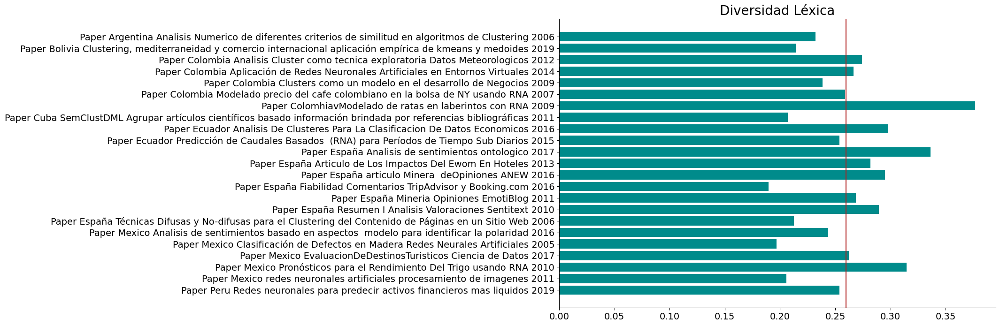

In [16]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
ax = plt.subplot(111)
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.barh(df1['Titulos'],df1['Diversidad'],color = 'darkcyan')
plt.title('Diversidad Léxica',fontsize=20 )
plt.axvline(x=df1['Diversidad'].mean(), color = 'firebrick')

plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.show()

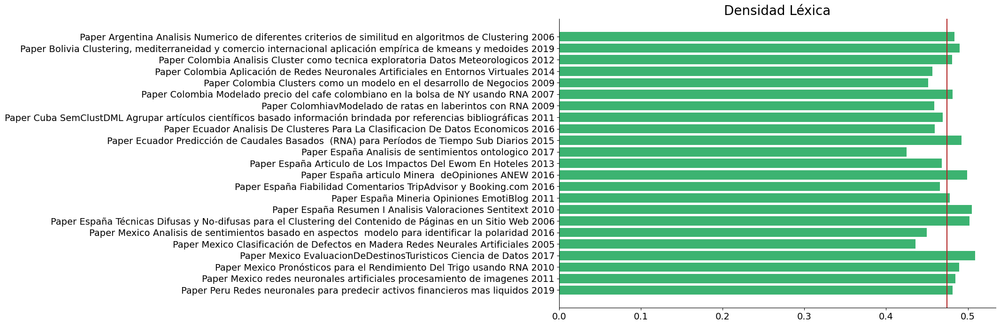

In [17]:
plt.figure(figsize=(12,8))
ax = plt.subplot(111)
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.barh(df1['Titulos'],df1['Densidad'],color = 'mediumseagreen')
plt.title('Densidad Léxica',fontsize=20 )
plt.axvline(x=df1['Densidad'].mean(), color = 'firebrick')

plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.show()

Sustantivos


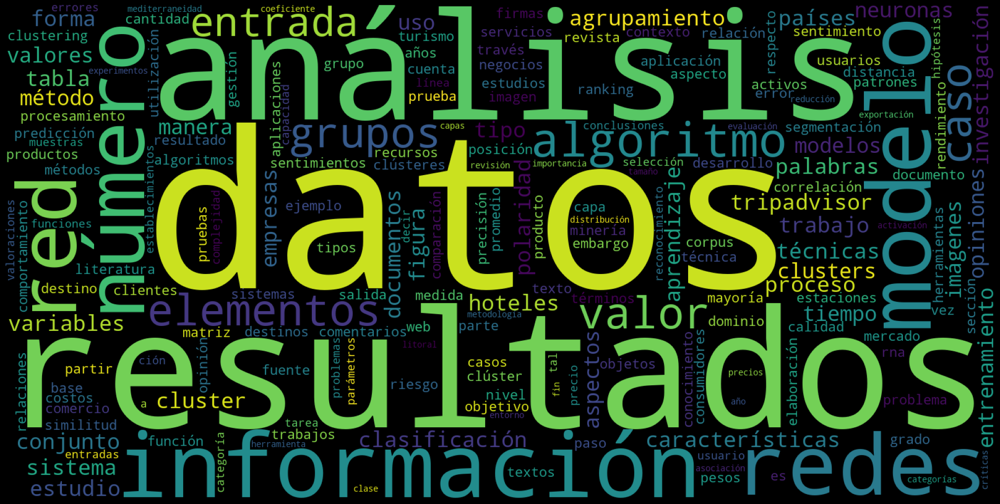

In [19]:
from wordcloud import WordCloud

print('Sustantivos')
nube = WordCloud()
wordcloud1 = WordCloud(width=1600, height=800).generate_from_frequencies(frequencies=coleccion_sustantivos)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud1)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

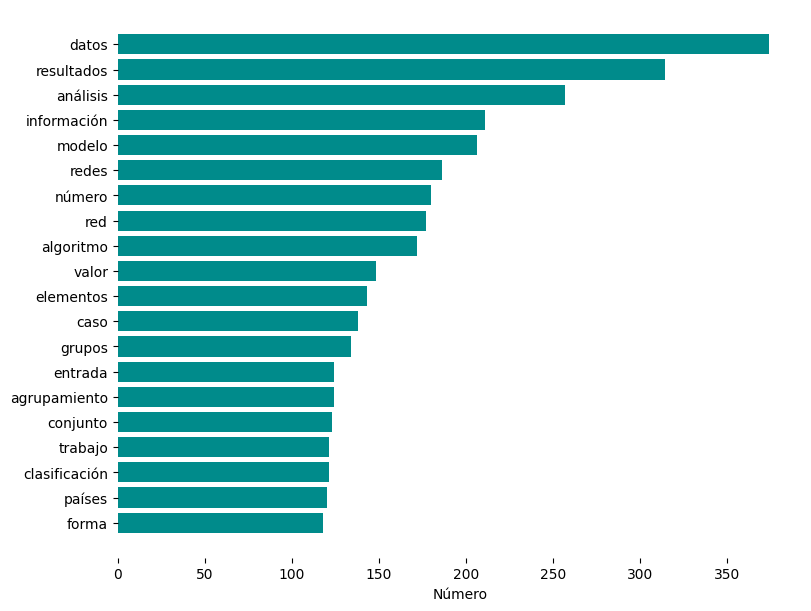

In [20]:
top20 = pd.Series(' '.join(df1['Sustantivos']).lower().split()).value_counts()[:20]
fig = plt.figure(figsize=(8, 6),constrained_layout=True)
#plt.title('Top 20 Palabras más usadas',fontsize=15,fontweight='bold')
plt.barh(top20.index,top20, color = 'darkcyan')
plt.gca().invert_yaxis()
plt.xlabel('Número')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
plt.show()   

Verbos


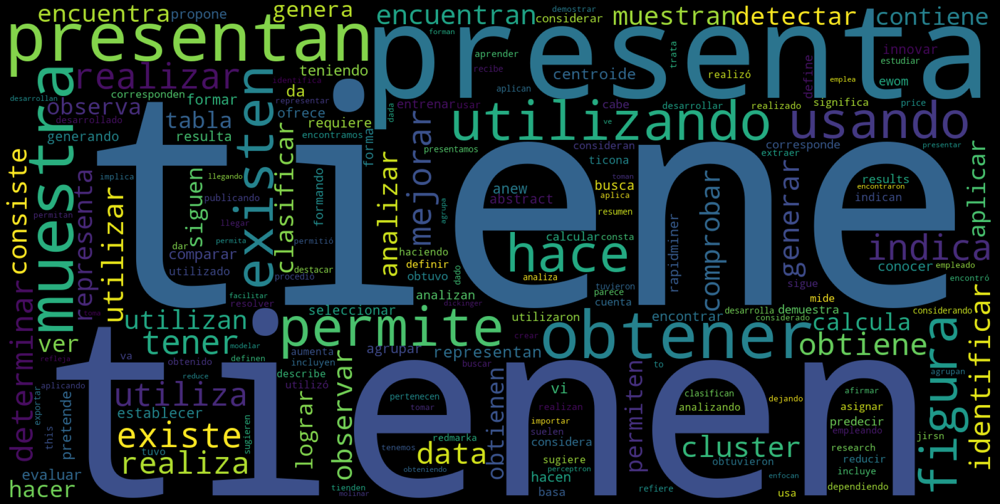

In [22]:
print('Verbos')
nube = WordCloud()
wordcloud1 = WordCloud(width=1600, height=800).generate_from_frequencies(frequencies=coleccion_verbos)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud1)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

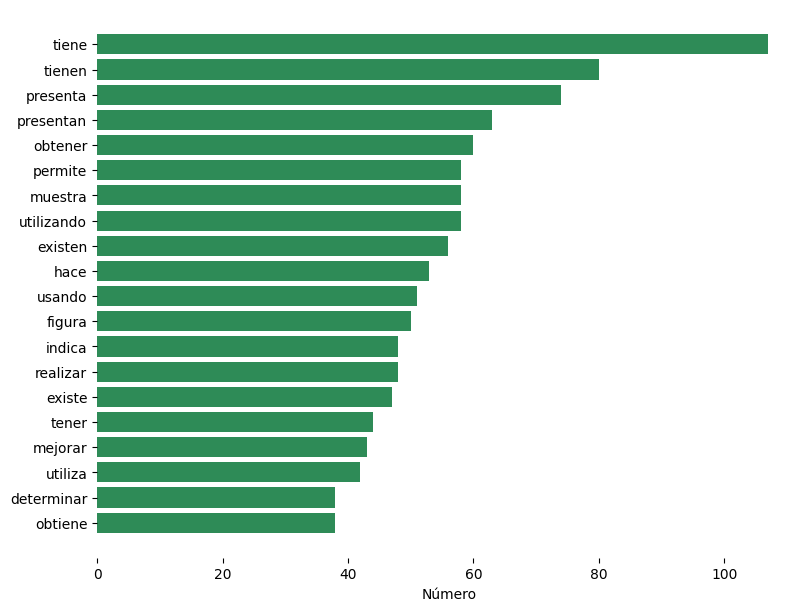

In [23]:
top20 = pd.Series(' '.join(df1['Verbos']).lower().split()).value_counts()[:20]
fig = plt.figure(figsize=(8, 6),constrained_layout=True)
#plt.title('Top 20 Palabras más usadas',fontsize=15,fontweight='bold')
plt.barh(top20.index,top20, color = 'seagreen')
plt.gca().invert_yaxis()
plt.xlabel('Número')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
plt.show()   

Adjetivos


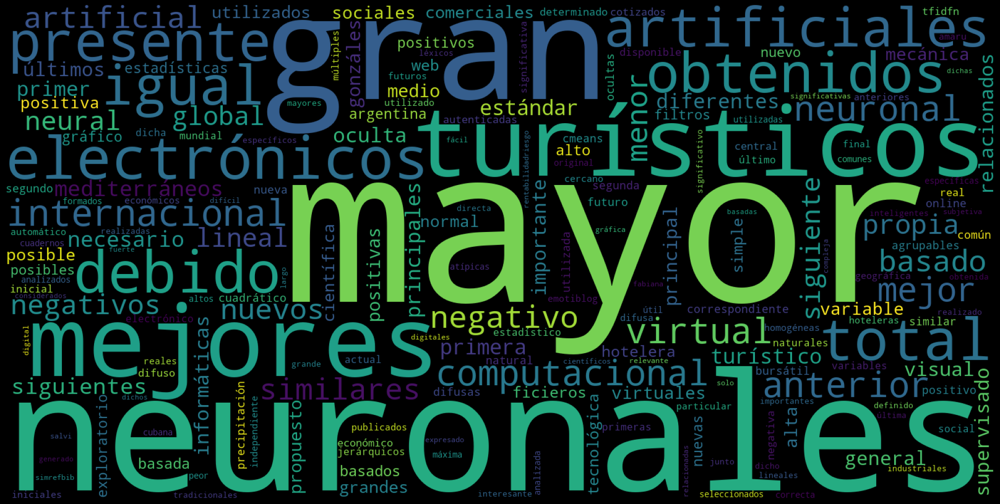

In [24]:
print('Adjetivos')
nube = WordCloud()
wordcloud1 = WordCloud(width=1600, height=800).generate_from_frequencies(frequencies=coleccion_adjetivos)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud1)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

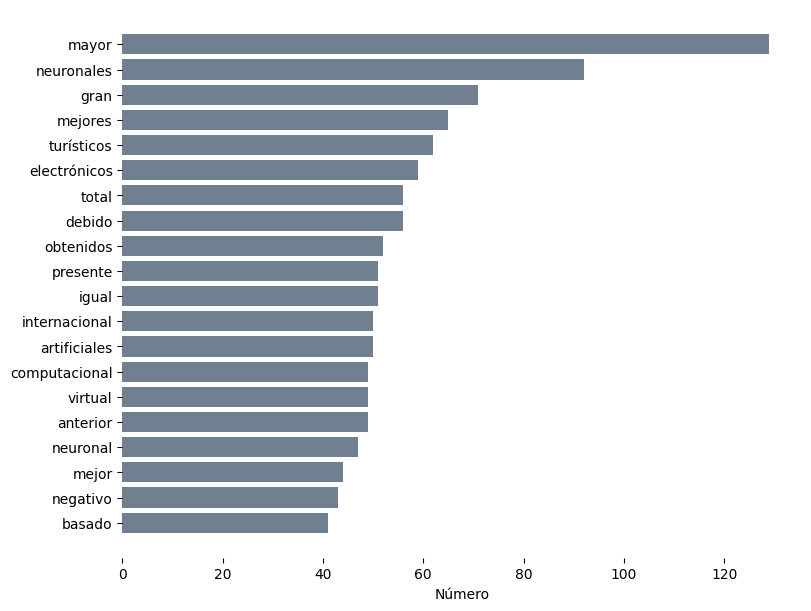

In [25]:
top20 = pd.Series(' '.join(df1['Adjetivos']).lower().split()).value_counts()[:20]
fig = plt.figure(figsize=(8, 6),constrained_layout=True)
#plt.title('Top 20 Palabras más usadas',fontsize=15,fontweight='bold')
plt.barh(top20.index,top20, color = 'slategray')
plt.gca().invert_yaxis()
plt.xlabel('Número')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
plt.show() 

Adverbios


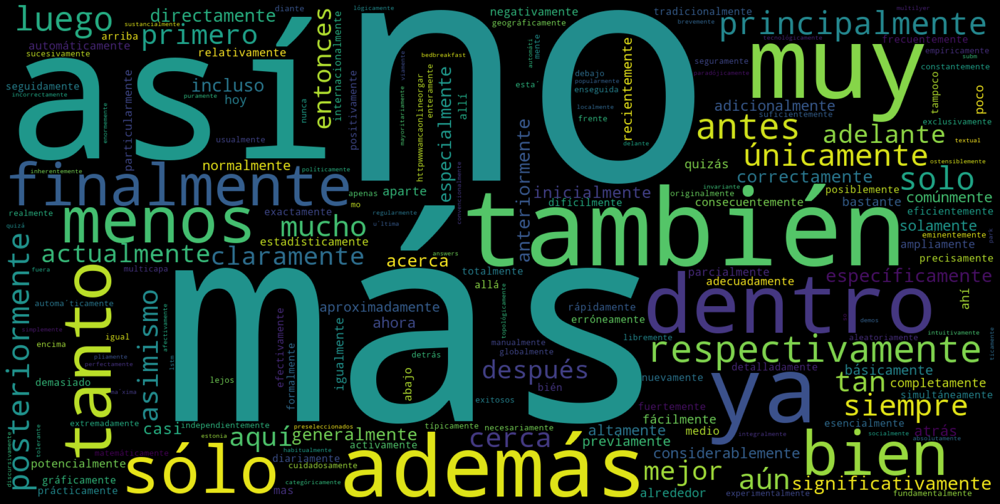

In [26]:
print('Adverbios')
nube = WordCloud()
wordcloud1 = WordCloud(width=1600, height=800).generate_from_frequencies(frequencies=coleccion_adverbios)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud1)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

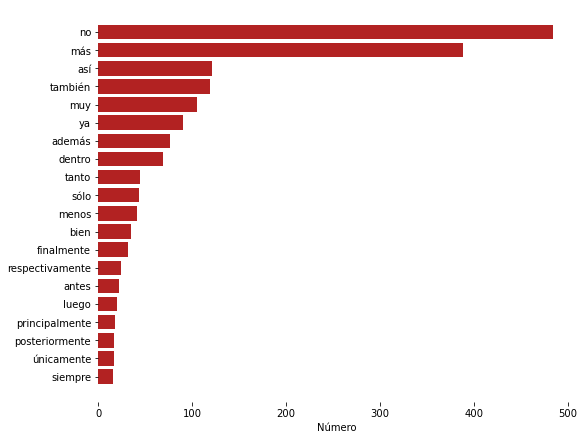

In [42]:
top20 = pd.Series(' '.join(df1['Adverbios']).lower().split()).value_counts()[:20]
fig = plt.figure(figsize=(8, 6),constrained_layout=True)
#plt.title('Top 20 Palabras más usadas',fontsize=15,fontweight='bold')
plt.barh(top20.index,top20, color = 'firebrick')
plt.gca().invert_yaxis()
plt.xlabel('Número')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
plt.show() 

## Guardando base de datos

In [30]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df1.to_csv('.\data\processed\datosSemanticos.csv', index=False)  # Guardar en un archivo CSV sin incluir el índice


# Análisis no supervisado

### Cargando base de datos

In [12]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df = pd.read_csv("./data/interim/datosProfesor.csv", dtype=str)

df = df.astype(str)

## Preprocesamiento

### Eliminando stopwords

In [7]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ANDREU\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

In [8]:
#Importamos stopwords
from nltk.corpus import stopwords
stop = stopwords.words("spanish")

In [16]:
import re, string

#Limpiar texto
def limpiar_texto (text):
    if text is None:
        return ''
    text = text.replace('\\n', " ")
    text = text.replace('\\t', " ")
    text = str(text).replace("nan",'').lower() #"Hacer las palabras en minusculas"
    text = re.sub(r'[%s]' % re.escape(string.punctuation), '', text) #Remover signos de puntuación
    text = re.sub('“', '',text) #Remover comillas dobles
    text = re.sub(r'\w*\d\w*', '', text) #Remover palabras que contengan numeros
    return ' '.join(word for word in text.split() if word not in stop)

In [10]:
# Remover palabras de 1 a 3 letras, salvo excepciones (items)
#Ayuda a remover errores al procesar y stopwords en ingles

#items1 = ['y','a','o','u','q','d']

#Conservar para corregir o se quedan porque existe la palabra largo =2
items2 = ['si','oh','él','iv','mo','ma','yo','ej','dr']

#Conservar para corregir o se quedan porque existe la palabra largo = 3
items3 = ['tal','dos','red','par','vez','ser','aún','fin','ver','dar','ahí','uso','año','pam',
          'key','mar','pie','día','set','min','bio','río','mes','uno','rna','ann','ojo','mlp','rbf','eje','tic',
          'web','dan','mas','tos','pro','erp','crm','vía','hoy','usd','mil','mse','lce','tba','pos','sal','mae',
          'pln','liu','svm','sol','wom','svs','fcm','rpm','pan','roe','roa','smv']

def remover_cortos(text):
    sent =[]
    text = text.split(" ")
    doc = list(text)
    for word in doc:
        if len(word) > 3:
            sent.append(word)     
        elif (len(word)==2 and word in items2):
            sent.append(word)
        elif (len(word)==3 and word in items3):
            sent.append(word)    
    return  " ".join(sent)

In [17]:
df['Texto_Limpio'] = df['Texto'].apply(lambda x: limpiar_texto(x))
df['Texto_Limpio'] = df['Texto_Limpio'].apply(lambda x: remover_cortos(x))

In [18]:
df.head()

,Titulos,Texto,Texto_Limpio
0,Paper Peru Redes neuronales para predecir acti...,resumen la presente investigación tiene como p...,resumen presente investigación propósito ident...
1,Paper Mexico redes neuronales artificiales pro...,resumen— el amplio uso de las redes neuronales...,resumen— amplio uso redes neuronales campo pro...
2,Paper Mexico Pronósticos para el Rendimiento D...,resumen en el presente trabajo se desarrolló u...,resumen presente trabajo desarrolló modelo pre...
3,Paper Mexico EvaluacionDeDestinosTuristicos Ci...,resumen: se presentan resultados de un estudio...,resumen presentan resultados estudio explorato...
4,Paper Mexico Clasificación de Defectos en Made...,resumen este artículo describe un clasificador...,resumen artículo describe clasificador neural ...


### Lematización

In [19]:
import stanza
stanza.download('es', package='ancora', processors='tokenize,mwt,pos,lemma', verbose=True)
stNLP = stanza.Pipeline(processors='tokenize,mwt,pos,lemma', lang='es', use_gpu=True)

p:\maestria-data_science\ciclo I\c2-2-MLNoSupervisado\s7-mineriaTextos\mineriaTextos\env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-02-28 15:27:37 INFO: Downloading these customized packages for language: es (Spanish)...
| Processor       | Package         |
-------------------------------------
| tokenize        | ancora          |
| mwt             | ancora          |
| pos             | ancora_charlm   |
| lemma           | ancora_nocharlm |
| pretrain        | conll17         |
| backward_charlm | newswiki        |
| forward_charlm  | newswiki        |

2024-02-28 15:29:18 INFO: Finished downloading models and saved to C:\Users\ANDREU\stanza_resources.
2024-02-28 15:29:18 INFO: Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with downloa

#### Creación de la función (2 opciones)

In [22]:
#def lemmatizer(text):
#    sent =[]
#    text = text.split(" ")
#    doc = list(text)
#    for word in doc:
#        sent.append(stNLP(word).sentences[0].words[0].lemma)
#    return  " ".join(sent)

import es_core_news_sm #función en español de spacy

nlp = es_core_news_sm.load()

def lemmatizer(text):        
    sent = []
    doc = nlp(text)
    for word in doc:
        sent.append(word.lemma_)
    return " ".join(sent)

In [23]:
%%time
#Demora bastante usando stannza (20 papers = 25 minutos aprox)
df['Texto_Lematizado'] = df['Texto_Limpio'].apply(lambda x: lemmatizer(x))

CPU times: total: 6.2 s
Wall time: 9.03 s


In [24]:
df.head()

,Titulos,Texto,Texto_Limpio,Texto_Lematizado
0,Paper Peru Redes neuronales para predecir acti...,resumen la presente investigación tiene como p...,resumen presente investigación propósito ident...,resumen presente investigación propósito ident...
1,Paper Mexico redes neuronales artificiales pro...,resumen— el amplio uso de las redes neuronales...,resumen— amplio uso redes neuronales campo pro...,resumen — amplio uso red neuronal campo proces...
2,Paper Mexico Pronósticos para el Rendimiento D...,resumen en el presente trabajo se desarrolló u...,resumen presente trabajo desarrolló modelo pre...,resumen presente trabajo desarrollar modelo pr...
3,Paper Mexico EvaluacionDeDestinosTuristicos Ci...,resumen: se presentan resultados de un estudio...,resumen presentan resultados estudio explorato...,resumen presentar resultado estudio explorator...
4,Paper Mexico Clasificación de Defectos en Made...,resumen este artículo describe un clasificador...,resumen artículo describe clasificador neural ...,resumen artículo describir clasificador neural...


### Stematización

In [25]:
from nltk.stem import SnowballStemmer
stemmer = SnowballStemmer("spanish")

In [26]:
def stem_palabras(text):        
    sent = []
    text = text.split()
    for word in text:
        sent.append(stemmer.stem(word))
    return " ".join(sent)

In [27]:
%%time
df['Texto_Stematizado'] = df['Texto_Limpio'].apply(lambda x: stem_palabras(x))

CPU times: total: 969 ms
Wall time: 1.57 s


In [28]:
df.head()

,Titulos,Texto,Texto_Limpio,Texto_Lematizado,Texto_Stematizado
0,Paper Peru Redes neuronales para predecir acti...,resumen la presente investigación tiene como p...,resumen presente investigación propósito ident...,resumen presente investigación propósito ident...,resum present investig proposit identific herr...
1,Paper Mexico redes neuronales artificiales pro...,resumen— el amplio uso de las redes neuronales...,resumen— amplio uso redes neuronales campo pro...,resumen — amplio uso red neuronal campo proces...,resumen— ampli uso red neuronal camp proces im...
2,Paper Mexico Pronósticos para el Rendimiento D...,resumen en el presente trabajo se desarrolló u...,resumen presente trabajo desarrolló modelo pre...,resumen presente trabajo desarrollar modelo pr...,resum present trabaj desarroll model prediccio...
3,Paper Mexico EvaluacionDeDestinosTuristicos Ci...,resumen: se presentan resultados de un estudio...,resumen presentan resultados estudio explorato...,resumen presentar resultado estudio explorator...,resum present result estudi exploratori aplic ...
4,Paper Mexico Clasificación de Defectos en Made...,resumen este artículo describe un clasificador...,resumen artículo describe clasificador neural ...,resumen artículo describir clasificador neural...,resum articul describ clasif neural diferenc t...


### Número de palabras por tipo de limpieza

In [30]:
from collections import Counter

coleccion1 = ""
coleccion2 = ""
coleccion3 = ""
coleccion4 = ""

coleccion1 = Counter()
df['Texto'].str.lower().str.split().apply(coleccion1.update)
coleccion2 = Counter()
df['Texto_Limpio'].str.lower().str.split().apply(coleccion2.update)
coleccion3 = Counter()
df['Texto_Lematizado'].str.lower().str.split().apply(coleccion3.update)
coleccion4 = Counter()
df['Texto_Stematizado'].str.lower().str.split().apply(coleccion4.update)
print('finalizado')

finalizado


In [31]:
tipo= ['Total','Limpio','Lematizado','Stematizado']
total_palabra = [sum(coleccion1.values()),sum(coleccion2.values()),sum(coleccion3.values()),sum(coleccion4.values())]
unicas = [len(coleccion1),len(coleccion2),len(coleccion3),len(coleccion4)]
resumen = pd.DataFrame([tipo,total_palabra,unicas], index = ['Tipo','Nro_Total','Nro_Unicas']).T
resumen

,Tipo,Nro_Total,Nro_Unicas
0,Total,112984,18393
1,Limpio,55099,10557
2,Lematizado,55509,8388
3,Stematizado,55099,6395


### Número de palabras por texto

In [32]:
#Usando Collections para el numero de palabras 
df['Numero_Palabras_texto'] = df.Texto.apply(lambda x: len(x.split()))
df['Numero_Palabras_limpio'] = df.Texto_Limpio.apply(lambda x: len(x.split()))
df['Numero_Palabras_lematizado'] = df.Texto_Lematizado.apply(lambda x: len(x.split()))
df['Numero_Palabras_stemming'] = df.Texto_Stematizado.apply(lambda x: len(x.split()))

In [33]:
%%time
df['Numero_Unicas_texto'] = df['Texto'].apply(lambda x: len(set(x.split())))
df['Numero_Unicas_limpio'] = df['Texto_Limpio'].apply(lambda x: len(set(x.split())))
df['Numero_Unicas_lematizado'] = df['Texto_Lematizado'].apply(lambda x: len(set(x.split())))
df['Numero_Unicas_stemming'] = df['Texto_Stematizado'].apply(lambda x: len(set(x.split())))

CPU times: total: 0 ns
Wall time: 49.3 ms


In [34]:
df.head(3)

,Titulos,Texto,Texto_Limpio,Texto_Lematizado,Texto_Stematizado,Numero_Palabras_texto,Numero_Palabras_limpio,Numero_Palabras_lematizado,Numero_Palabras_stemming,Numero_Unicas_texto,Numero_Unicas_limpio,Numero_Unicas_lematizado,Numero_Unicas_stemming
0,Paper Peru Redes neuronales para predecir acti...,resumen la presente investigación tiene como p...,resumen presente investigación propósito ident...,resumen presente investigación propósito ident...,resum present investig proposit identific herr...,5101,2626,2634,2626,1437,1134,961,812
1,Paper Mexico redes neuronales artificiales pro...,resumen— el amplio uso de las redes neuronales...,resumen— amplio uso redes neuronales campo pro...,resumen — amplio uso red neuronal campo proces...,resumen— ampli uso red neuronal camp proces im...,6803,3240,3245,3240,1764,1150,969,793
2,Paper Mexico Pronósticos para el Rendimiento D...,resumen en el presente trabajo se desarrolló u...,resumen presente trabajo desarrolló modelo pre...,resumen presente trabajo desarrollar modelo pr...,resum present trabaj desarroll model prediccio...,1905,981,983,981,700,482,429,389


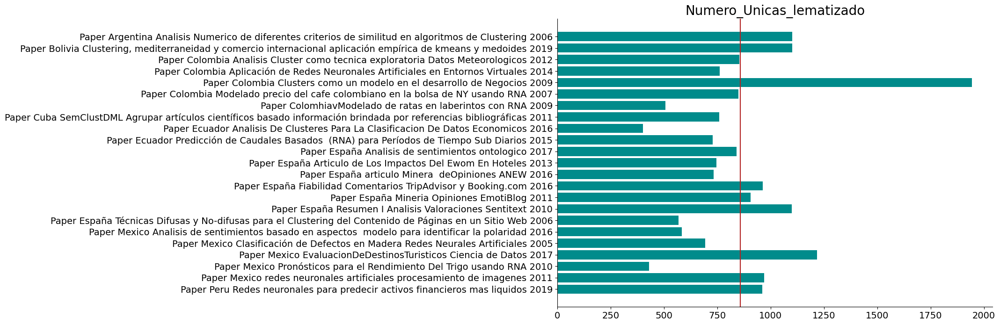

In [36]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
ax = plt.subplot(111)
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.barh(df1['Titulos'],df['Numero_Unicas_lematizado'],color = 'darkcyan')
plt.title('Numero_Unicas_lematizado',fontsize=20 )
plt.axvline(x=df['Numero_Unicas_lematizado'].mean(), color = 'firebrick')

plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.show()

### Frecuencia de palabras

In [37]:
from collections import Counter
coleccion1 = ""
coleccion1 = Counter()
df['Texto_Lematizado'].str.split().apply(coleccion1.update)
df_lema = pd.DataFrame.from_dict(coleccion1, orient='index').reset_index()
df_lema.rename(columns={ df_lema.columns[1]: "Cantidad" , df_lema.columns[0]: "Palabra" }, inplace = True)
df_lema.sort_values('Cantidad', ascending = False).head(10)

,Palabra,Cantidad
545,resultado,380
494,dato,371
9,red,364
56,poder,362
675,modelo,296
274,análisis,252
282,cada,252
391,algoritmo,250
25,valor,232
3245,cluster,230


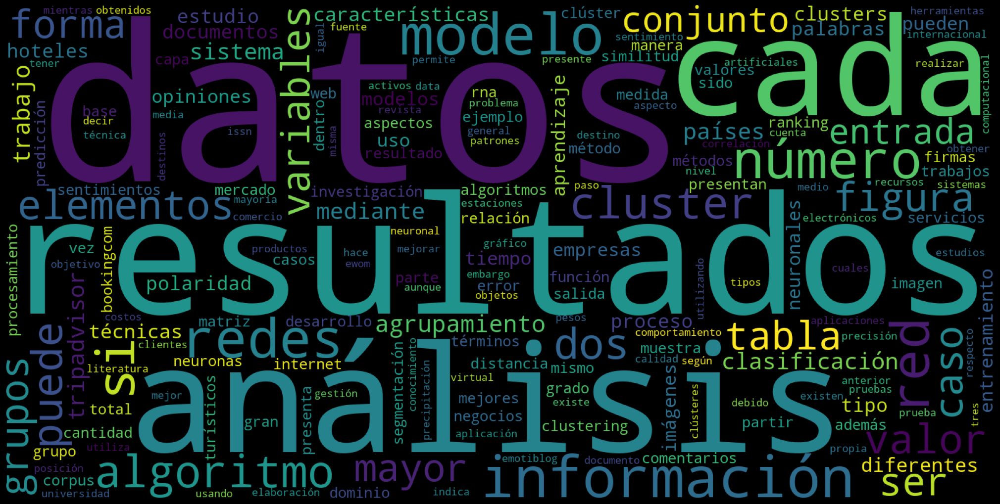

In [39]:
from wordcloud import WordCloud

#Total
coleccion1 = ""
coleccion1 = Counter()
df['Texto_Limpio'].str.lower().str.split().apply(coleccion1.update)

nube = WordCloud()
wordcloud1 = WordCloud(width=1600, height=800).generate_from_frequencies(frequencies=coleccion1)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud1)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

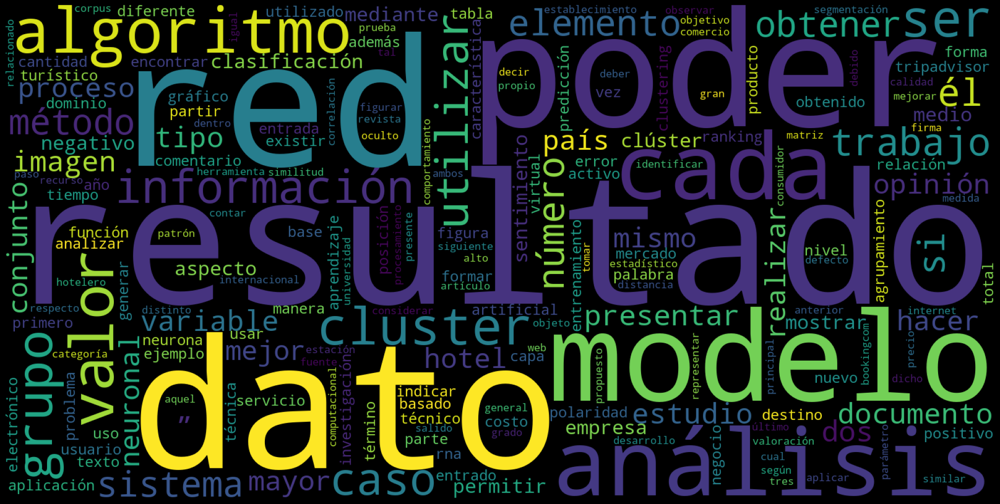

In [40]:
#Lematizado
coleccion1 = ""
coleccion1 = Counter()
df['Texto_Lematizado'].str.lower().str.split().apply(coleccion1.update)

nube = WordCloud()
wordcloud1 = WordCloud(width=1600, height=800).generate_from_frequencies(frequencies=coleccion1)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud1)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Guardando base de datos:

In [41]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df.to_csv('.\data\processed\datosNoSupervisado.csv', index=False)  # Guardar en un archivo CSV sin incluir el índice


Cargando base de datos:

In [42]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df = pd.read_csv("./data/processed/datosNoSupervisado.csv", dtype=str)

df = df.astype(str)

### Obteniendo la matriz TF - IDF

In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
##calcular TF-IDF
vectores=TfidfVectorizer()
tfs=vectores.fit_transform(df['Texto_Lematizado'])
##guardar los nombres
nombres=vectores.get_feature_names_out()
#convertir la matriz a densa, luego lista, luego dataframe y trasponerla
matriz=tfs.todense()
matlist=matriz.tolist()
finalm=pd.DataFrame(matlist,columns=nombres)
final2=finalm.transpose()
final2.head(10)

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
abajo,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00948,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.005250,0.014202
abandonar,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,...,0.0,0.0,0.0,0.017588,0.0,0.000000,0.0,0.0,0.000000,0.000000
abarcar,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.007815,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.004818,0.0,0.0,0.000000,0.000000
abaste,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.006014,0.0,0.0,0.000000,0.000000
abastecer,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.006014,0.0,0.0,0.000000,0.000000
abastecimiento,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.018042,0.0,0.0,0.000000,0.000000
abcd,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.008864
abceseboliisec,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.006553,0.000000
abdou,0.010581,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
abier,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,...,0.0,0.0,0.0,0.052764,0.0,0.000000,0.0,0.0,0.000000,0.000000


In [51]:
tf_idf_total = pd.DataFrame(final2.sum(axis=1))

In [52]:
tf_idf_total.tail(11)

,0
𝐶𝐴𝐶𝑖,0.026472
𝐶𝑐𝑒𝑛𝑡𝑟𝑜𝑖𝑑𝑒,0.008824
𝐶𝑖,0.008824
𝐶𝑗,0.008824
𝐸𝐴𝐶𝐶𝑖𝑘,0.017648
𝐸𝐴𝐶𝑖,0.008824
𝐸𝑙𝑒𝑚𝑡𝑆𝑖𝑚𝑖,0.026472
𝑆𝑖𝑚𝑅𝑒𝑓𝐵𝑖𝑏𝑖,0.008824
𝑐𝑎𝑝𝑐𝑔,0.017648
𝑙𝑜𝑔𝑘,0.026472


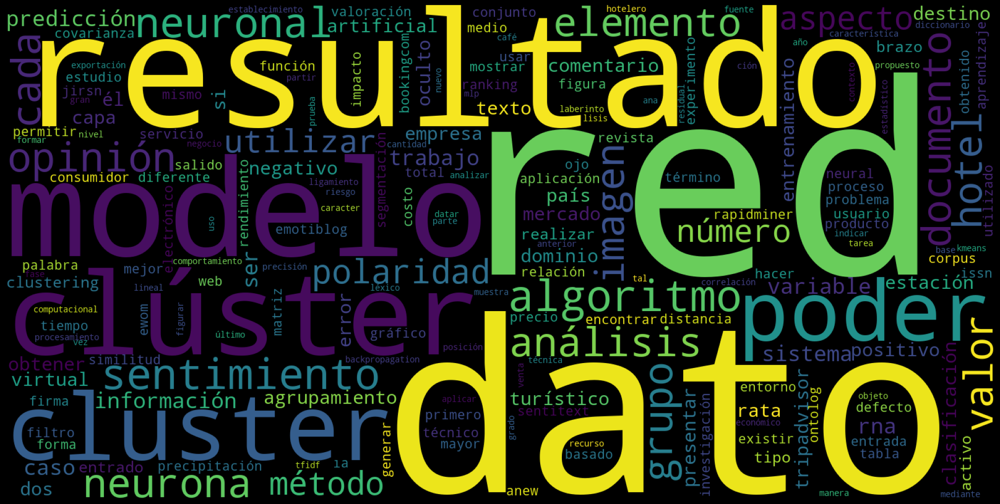

In [53]:
tf_idf_total["palabra"]=tf_idf_total.index

##Wordcloud con las palabras del tf-idf
diccio={}
for freq,name in tf_idf_total.values:
    diccio[name]=freq



wordcloud = WordCloud(width=1600, height=800)
wordcloud.generate_from_frequencies(frequencies=diccio)

plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [54]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df.to_csv('.\data\processed\datosSemanticosFinal.csv', index=False)  # Guardar en un archivo CSV sin incluir el índice


In [72]:
#df_lema.to_excel('revisar.xlsx')

## Modelamiento del aprendizaje no supervisado

In [2]:
directorio = "P:/maestria-data_science/ciclo I/c2-2-MLNoSupervisado/s7-mineriaTextos/mineriaTextos"
os.chdir(directorio)

df = pd.read_csv("./data/processed/datosSemanticosFinal.csv", dtype=str)

df = df.astype(str)

### TF: En base a frecuencias

In [3]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import MaxAbsScaler
from sklearn.metrics.pairwise import cosine_similarity
scaler = MaxAbsScaler()

In [4]:
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df['Texto_Lematizado'])

X = X[:,:-10]
X = X.toarray()

k-means:

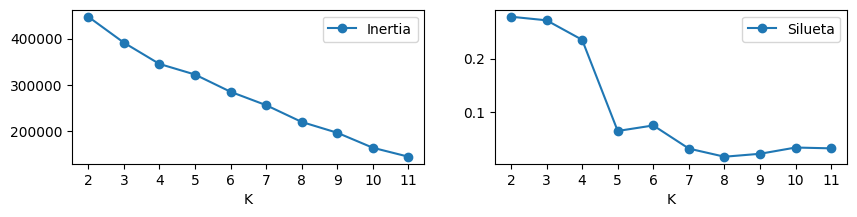

In [60]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture

results = dict()
k_cand = list(range(2,12))

for k in k_cand:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    score0 = kmeans.inertia_
    score1 = silhouette_score(X,kmeans.labels_)
    results[k] = {'k':kmeans,'s0':score0,'s1':score1}

fig,axs = plt.subplots(1,2,sharex=True,figsize=(10,2))
axs[0].plot([i for i in results.keys()],[i['s0'] for i in results.values()],'o-',label='Inertia')
axs[1].plot([i for i in results.keys()],[i['s1'] for i in results.values()],'o-',label='Silueta')

for ax in axs:
    ax.set_xticks(k_cand)
    ax.set_xlabel('K')
    ax.legend()

Modelo de Mixtura Gaussiana:

In [5]:
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture

results = dict()
k_cand = list(range(2, 12))

for k in k_cand:
    gmm = GaussianMixture(n_components=k,
                          covariance_type='full',  # Ajusta este valor según tu necesidad
                          tol=0.001,
                          max_iter=100,
                          n_init=1,
                          init_params='kmeans',
                          random_state=0
                          )
    gmm.fit(X)
    score0 = gmm.bic(X)  # Utiliza el criterio BIC en lugar de la inercia para GMM
    score1 = silhouette_score(X, gmm.predict(X))  # Calcula el coeficiente de silueta para GMM
    results[k] = {'k': gmm, 's0': score0, 's1': score1}

fig, axs = plt.subplots(1, 2, sharex=True, figsize=(10, 2))
axs[0].plot([i for i in results.keys()], [i['s0'] for i in results.values()], 'o-', label='BIC')
axs[1].plot([i for i in results.keys()], [i['s1'] for i in results.values()], 'o-', label='Silueta')

for ax in axs:
    ax.set_xticks(k_cand)
    ax.set_xlabel('K')
    ax.legend()

plt.show()


MemoryError: Unable to allocate 2.60 GiB for an array with shape (5, 8357, 8357) and data type float64

In [76]:
from kneed import KneeLocator #Punto de inflexion

inercia = [i['s0'] for i in results.values()]
kl = KneeLocator(range(2,12), inercia, curve="convex", direction="decreasing")
kl.elbow

6

In [77]:
# Por silueta
true_k = 4
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10, random_state=0)
model.fit(X)
labels=model.labels_

In [78]:
sample_silhouette_values = silhouette_samples(X, labels)

means_lst = []
for label in range(true_k):
    means_lst.append(sample_silhouette_values[labels == label].mean())
means_lst    

[0.0, 0.27599342365682716, 0.0, 0.0]

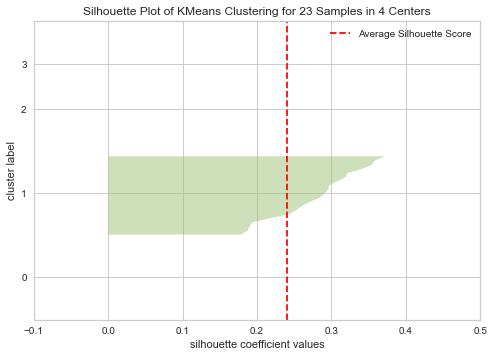

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 23 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(max_iter=200, n_clusters=4,
                                      random_state=0))

In [79]:
#!pip install yellowbrick
from yellowbrick.cluster import silhouette_visualizer
silhouette_visualizer(KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10, random_state=0), X, colors='yellowbrick')    

In [80]:
# Por Codo
true_k = 6
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10, random_state=0)
model.fit(X)
labels=model.labels_

In [81]:
sample_silhouette_values = silhouette_samples(X, labels)

means_lst = []
for label in range(true_k):
    means_lst.append(sample_silhouette_values[labels == label].mean())
means_lst    

[0.0, 0.09756337172553566, 0.0, 0.0, 0.05115396157362967, 0.025831367712910735]

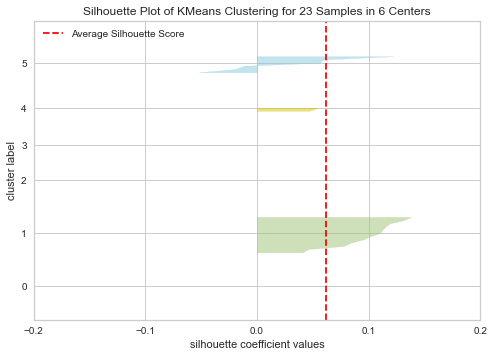

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 23 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(max_iter=200, n_clusters=6,
                                      random_state=0))

In [82]:
#!pip install yellowbrick
from yellowbrick.cluster import silhouette_visualizer
silhouette_visualizer(KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10, random_state=0), X, colors='yellowbrick')    

In [83]:
df['Cluster_TF'] = labels

In [84]:
df.groupby('Cluster_TF').size()

Cluster_TF
0     1
1    12
2     1
3     1
4     2
5     6
dtype: int64

In [85]:
pd.options.display.max_colwidth = 120
df[['Cluster_TF','Titulos']].sort_values(by=['Cluster_TF'])

,Cluster_TF,Titulos
13,0,Paper España Fiabilidad Comentarios TripAdvisor y Booking.com 2016
11,1,Paper España Articulo de Los Impactos Del Ewom En Hoteles 2013
19,1,Paper Mexico EvaluacionDeDestinosTuristicos Ciencia de Datos 2017
17,1,Paper Mexico Analisis de sentimientos basado en aspectos modelo para identificar la polaridad 2016
16,1,Paper España Técnicas Difusas y No-difusas para el Clustering del Contenido de Páginas en un Sitio Web 2006
15,1,Paper España Resumen I Analisis Valoraciones Sentitext 2010
14,1,Paper España Mineria Opiniones EmotiBlog 2011
12,1,Paper España articulo Minera deOpiniones ANEW 2016
10,1,Paper España Analisis de sentimientos ontologico 2017
22,1,Paper Peru Redes neuronales para predecir activos financieros mas liquidos 2019


###  En base a TF - IDF

In [86]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df['Texto_Lematizado'])
X = X[:,:-10]

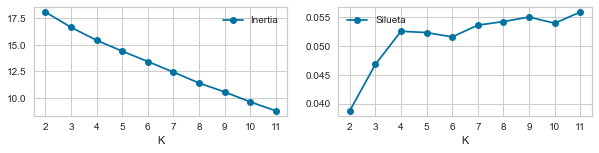

In [87]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

results = dict()
k_cand = list(range(2,12))

for k in k_cand:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    score0 = kmeans.inertia_
    score1 = silhouette_score(X,kmeans.labels_)
    results[k] = {'k':kmeans,'s0':score0,'s1':score1}

fig,axs = plt.subplots(1,2,sharex=True,figsize=(10,2))
axs[0].plot([i for i in results.keys()],[i['s0'] for i in results.values()],'o-',label='Inertia')
axs[1].plot([i for i in results.keys()],[i['s1'] for i in results.values()],'o-',label='Silueta')

for ax in axs:
    ax.set_xticks(k_cand)
    ax.set_xlabel('K')
    ax.legend()

In [88]:
from kneed import  KneeLocator #Punto de inflexion

inercia = [i['s0'] for i in results.values()]
kl = KneeLocator(range(2,12), inercia, curve="convex", direction="decreasing")
kl.elbow

C:\Users\Dell\anaconda3\lib\site-packages\kneed\knee_locator.py:304: UserWarning: No knee/elbow found
  warnings.warn("No knee/elbow found")


In [89]:
true_k = 9
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10,random_state=0)
model.fit(X)
labels=model.labels_

In [90]:
sample_silhouette_values = silhouette_samples(X, labels)

means_lst = []
for label in range(true_k):
    means_lst.append(sample_silhouette_values[model.labels_ == label].mean())
means_lst    

[0.022351970216361372,
 0.055316097010034294,
 0.025977034135894955,
 0.07206055693316457,
 0.08952659029113386,
 0.16097503434075505,
 0.0,
 0.0,
 0.0]

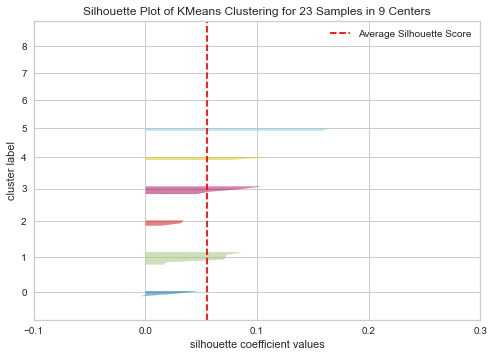

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 23 Samples in 9 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(n_clusters=9, random_state=0))

In [91]:
#!pip install yellowbrick
from yellowbrick.cluster import silhouette_visualizer
silhouette_visualizer(KMeans(true_k, random_state=0), X, colors='yellowbrick')   

In [92]:
# Mejor de menos grupos
true_k = 4
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10,random_state=0)
model.fit(X)
labels=model.labels_

In [93]:
sample_silhouette_values = silhouette_samples(X, labels)

means_lst = []
for label in range(true_k):
    means_lst.append(sample_silhouette_values[model.labels_ == label].mean())
means_lst    

[0.02294774153027386,
 0.05108588493353797,
 0.050380417425224346,
 0.0812837543296001]

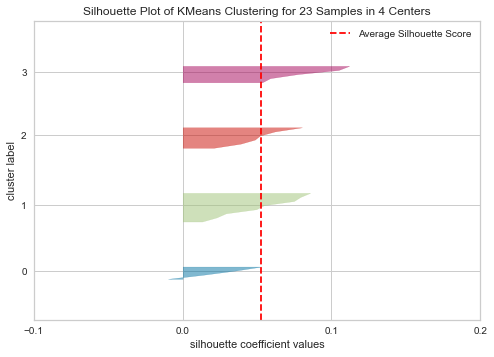

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 23 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(max_iter=200, n_clusters=4,
                                      random_state=0))

In [94]:
#!pip install yellowbrick
from yellowbrick.cluster import silhouette_visualizer
silhouette_visualizer(KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10,random_state=0), X, colors='yellowbrick')   

In [95]:
df['Cluster'] = labels

In [96]:
df.groupby('Cluster').size()

Cluster
0    4
1    8
2    6
3    5
dtype: int64

In [97]:
pd.options.display.max_colwidth = 120
df[['Cluster','Titulos']].sort_values(by=['Cluster'])

,Cluster,Titulos
11,0,Paper España Articulo de Los Impactos Del Ewom En Hoteles 2013
19,0,Paper Mexico EvaluacionDeDestinosTuristicos Ciencia de Datos 2017
4,0,Paper Colombia Clusters como un modelo en el desarrollo de Negocios 2009
13,0,Paper España Fiabilidad Comentarios TripAdvisor y Booking.com 2016
20,1,Paper Mexico Pronósticos para el Rendimiento Del Trigo usando RNA 2010
18,1,Paper Mexico Clasificación de Defectos en Madera Redes Neurales Artificiales 2005
21,1,Paper Mexico redes neuronales artificiales procesamiento de imagenes 2011
9,1,Paper Ecuador Predicción de Caudales Basados (RNA) para Períodos de Tiempo Sub Diarios 2015
22,1,Paper Peru Redes neuronales para predecir activos financieros mas liquidos 2019
6,1,Paper ColomhiavModelado de ratas en laberintos con RNA 2009


## En base a word embedings

In [98]:
from gensim.models import Word2Vec
import nltk
def tokenize(text):
    words = nltk.word_tokenize(text, "spanish")
    return [word for word in words if word.isalnum()]

sent = (df['Texto_Lematizado'].apply(tokenize)).tolist()
model = Word2Vec(sent,min_count=5, #minimo número de ocurrencias para ser incluidas en el modelo
                     window=35, # La maxima distancia entre la ocurrencia y la palabra predicha en una oración 
                     size=50, #La dimensionalidad de los vectores
                )

In [99]:
#preparar la data al formato para el word embedding
final_data = []
for i, row in df.iterrows():
    vectorized = []
    doc = row['Texto_Lematizado']
    all_words = doc.split(sep=" ")
    for w in all_words:
        try:
            vectorized.append(list(model[w]))
        except Exception as e:
            pass
    try:
        vectorized = np.asarray(vectorized)
        vectorized_mean = list(np.mean(vectorized, axis=0))
    except Exception as e:
        vectorized_mean = list(np.zeros(100))
        pass
    try:
        len(vectorized_mean)
    except:
        vectorized_mean = list(np.zeros(100))
    temp_row = np.asarray(vectorized_mean)
    final_data.append(temp_row)
X = np.asarray(final_data)
print('Conversion to array complete') 


C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


Conversion to array complete


In [100]:
X

array([[ 0.46185523,  0.18876533,  0.287444  , ...,  0.30088753,
         0.3163326 , -0.5060244 ],
       [ 0.43632942,  0.24799104,  0.29704636, ...,  0.2927391 ,
         0.29674837, -0.54934216],
       [ 0.48297632,  0.20976868,  0.29840043, ...,  0.31506214,
         0.3370845 , -0.5406364 ],
       ...,
       [ 0.45510975,  0.16690692,  0.26696843, ...,  0.29401815,
         0.2451149 , -0.4773016 ],
       [ 0.44515002,  0.20419921,  0.289328  , ...,  0.31171864,
         0.25807613, -0.51239985],
       [ 0.4175235 ,  0.21958923,  0.28324002, ...,  0.28537774,
         0.2776203 , -0.49567524]], dtype=float32)

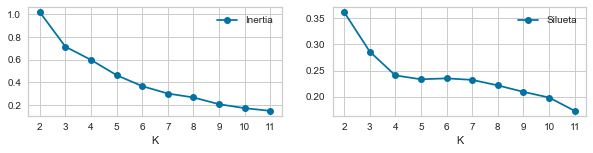

In [101]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

results = dict()
k_cand = list(range(2,12))

for k in k_cand:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    score0 = kmeans.inertia_
    score1 = silhouette_score(X,kmeans.labels_)
    results[k] = {'k':kmeans,'s0':score0,'s1':score1}

fig,axs = plt.subplots(1,2,sharex=True,figsize=(10,2))
axs[0].plot([i for i in results.keys()],[i['s0'] for i in results.values()],'o-',label='Inertia')
axs[1].plot([i for i in results.keys()],[i['s1'] for i in results.values()],'o-',label='Silueta')

for ax in axs:
    ax.set_xticks(k_cand)
    ax.set_xlabel('K')
    ax.legend()

In [102]:
from kneed import  KneeLocator #Punto de inflexion

inercia = [i['s0'] for i in results.values()]
kl = KneeLocator(range(2,12), inercia, curve="convex", direction="decreasing")
kl.elbow

6

In [103]:
# Mejor de menos grupos
true_k = 6
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10,random_state=0)
model.fit(X)
labels=model.labels_

In [104]:
sample_silhouette_values = silhouette_samples(X, labels)

means_lst = []
for label in range(true_k):
    means_lst.append(sample_silhouette_values[model.labels_ == label].mean())
means_lst    

[0.25027478, 0.43677893, 0.10028967, 0.099318475, 0.26980236, 0.0]

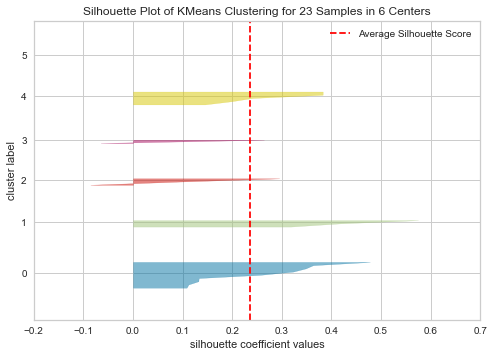

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 23 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick',
                     estimator=KMeans(max_iter=200, n_clusters=6,
                                      random_state=0))

In [105]:
#!pip install yellowbrick
from yellowbrick.cluster import silhouette_visualizer
silhouette_visualizer(KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10,random_state=0), X, colors='yellowbrick')   

In [106]:
df['Cluster_Embedings'] = labels

In [107]:
df.groupby('Cluster_Embedings').size()

Cluster_Embedings
0    9
1    3
2    3
3    2
4    5
5    1
dtype: int64

In [108]:
pd.options.display.max_colwidth = 120
df[['Cluster_Embedings','Titulos']].sort_values(by=['Cluster_Embedings'])

,Cluster_Embedings,Titulos
11,0,Paper España Articulo de Los Impactos Del Ewom En Hoteles 2013
19,0,Paper Mexico EvaluacionDeDestinosTuristicos Ciencia de Datos 2017
15,0,Paper España Resumen I Analisis Valoraciones Sentitext 2010
12,0,Paper España articulo Minera deOpiniones ANEW 2016
10,0,Paper España Analisis de sentimientos ontologico 2017
8,0,Paper Ecuador Analisis De Clusteres Para La Clasificacion De Datos Economicos 2016
22,0,Paper Peru Redes neuronales para predecir activos financieros mas liquidos 2019
4,0,Paper Colombia Clusters como un modelo en el desarrollo de Negocios 2009
1,0,"Paper Bolivia Clustering, mediterraneidad y comercio internacional aplicación empírica de kmeans y medoides 2019"
9,1,Paper Ecuador Predicción de Caudales Basados (RNA) para Períodos de Tiempo Sub Diarios 2015


### Análisis del mejor clustering

In [109]:
# Mejor de mejores grupos, tfidf de 4 grupos
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df['Texto_Lematizado'])
X = X[:,:-10]

true_k = 4
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10,random_state=0)
model.fit(X)
labels=model.labels_

In [110]:
print("Top terms per cluster:")
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(true_k):
    print("Cluster %d:" % i),
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind])
    print()

Top terms per cluster:
Cluster 0:
 destino
 turístico
 hotel
 ewom
 tripadvisor
 firma
 cluster
 ranking
 consumidor
 empresa

Cluster 1:
 red
 neurona
 modelo
 neuronal
 rna
 capa
 entrada
 imagen
 artificial
 rata

Cluster 2:
 clúster
 cluster
 grupo
 documento
 agrupamiento
 distancia
 estación
 dato
 elemento
 país

Cluster 3:
 sentimiento
 polaridad
 opinión
 aspecto
 dominio
 texto
 anew
 emotiblo
 palabra
 corpus



Cluster: 0


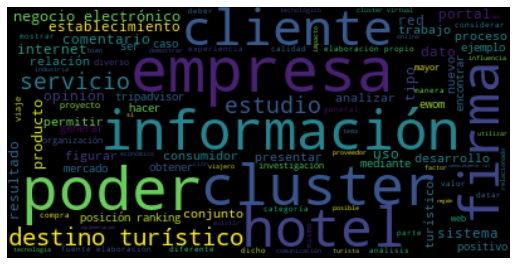

Cluster: 1


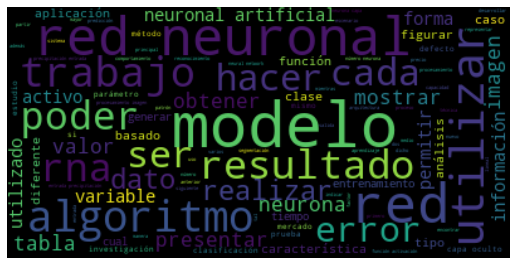

Cluster: 2


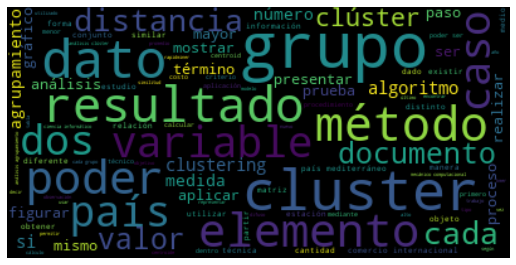

Cluster: 3


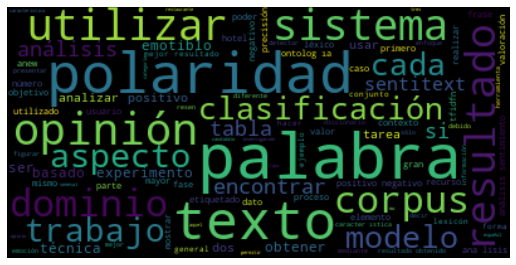

In [111]:
true_k = 4

from wordcloud import WordCloud
result={'cluster':labels,'palabras':df['Texto_Lematizado']}
result=pd.DataFrame(result)
for k in range(0,true_k):
    s=result[result.cluster==k]
    text=s['palabras'].str.cat(sep=' ')
    text=text.lower()
    text=' '.join([word for word in text.split()])
    wordcloud = WordCloud(max_font_size=50, max_words=100).generate(text)
    print('Cluster: {}'.format(k)) 
    plt.figure(figsize=(9, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [112]:
# Relaciones entre palabras a traves de un gráfico de redes
import networkx as nx

In [113]:
import nltk
nltk.download('punkt')

from nltk.tokenize import sent_tokenize, word_tokenize, RegexpTokenizer
df['tokenizado'] = df['Texto_Lematizado'].apply(word_tokenize) 
df['bigrams'] = df['tokenizado'].apply(lambda row: list(nltk.ngrams(row, 2)))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


#### Gráfico de red

Cluster :  0


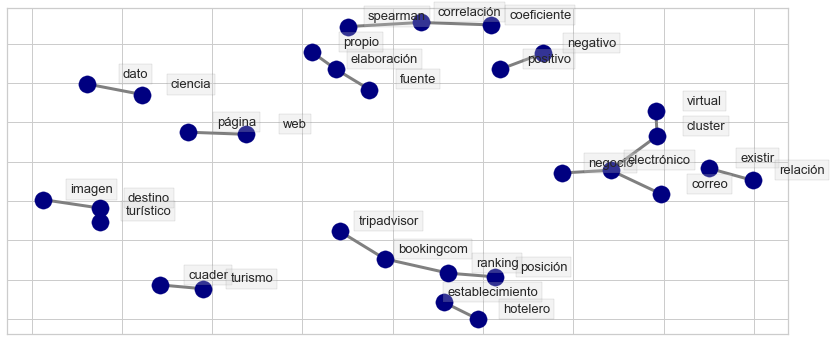

Cluster :  1


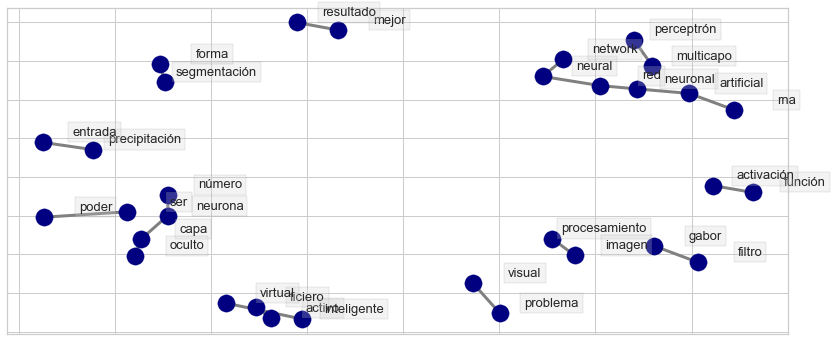

Cluster :  2


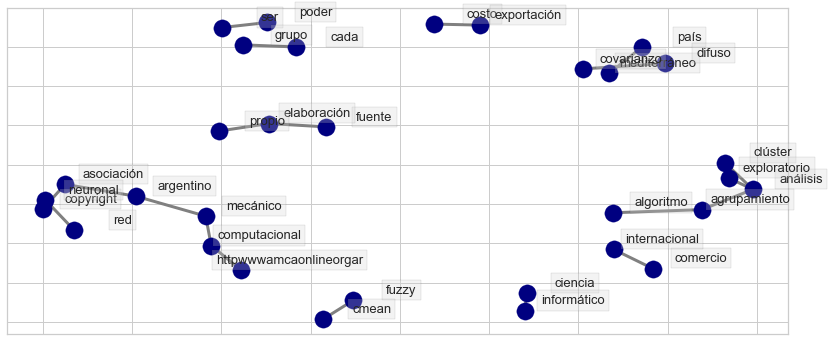

Cluster :  3


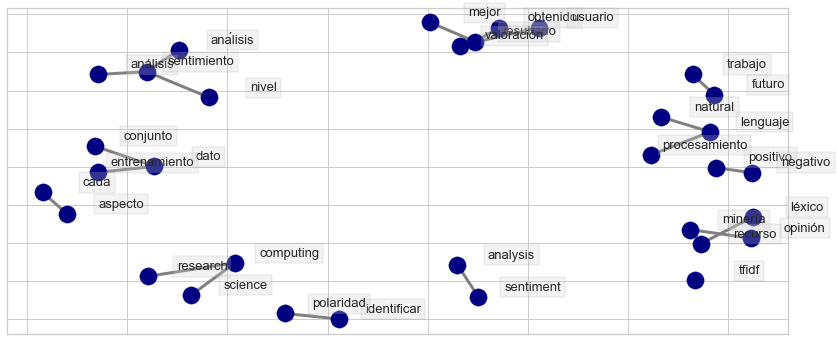

In [114]:
for i in range(4):
    print('Cluster : ',i)
    bigramas_list = [[bigrama for bigrama in lista] for lista in df['bigrams'][(df['Cluster']==i)]]
    bigramas = list(itertools.chain(*bigramas_list))
    bigram_counts = Counter(bigramas)
    bigram_df = pd.DataFrame(bigram_counts.most_common(20),columns=['bigram', 'count'])
    d = bigram_df.set_index('bigram').T.to_dict('records')
    G = nx.Graph()

    # Create connections between nodes
    for k, v in d[0].items():
        G.add_edge(k[0], k[1], weight=(v * 10))

    fig, ax = plt.subplots(figsize=(14, 6))

    pos = nx.spring_layout(G, k=2)

    # Plot networks
    nx.draw_networkx(G, pos,
                     font_size=16,
                     width=3,
                     edge_color='grey',
                     node_color='navy',
                     with_labels = False,
                     ax=ax)

    # Create offset labels
    for key, value in pos.items():
        x, y = value[0]+.135, value[1]+.045
        ax.text(x, y,
                s=key,
                bbox=dict(facecolor='lightgray', alpha=0.25),
                horizontalalignment='center', fontsize=13)

    plt.show()    

## Topic modeling (LDA)

### Con la libreria de sklearn

In [115]:
from sklearn.decomposition import LatentDirichletAllocation

In [116]:
paralda = CountVectorizer(min_df=2, max_features=1000)
tflda=paralda.fit_transform(df['Texto_Lematizado'])
nombreslda=paralda.get_feature_names()

In [117]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print ("Topic %d:" % (topic_idx))
        print (" ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

In [118]:
no_top_words = 5
n = 12
lda = LatentDirichletAllocation(n_components=n, max_iter=5, learning_method='online', learning_offset=50.,random_state=0).fit(tflda)
id_topico=lda.fit_transform(tflda)
display_topics(lda,nombreslda,no_top_words)

Topic 0:
documento cluster término difuso clustering
Topic 1:
cluster empresa destino turístico negocio
Topic 2:
tripadvisor ranking hotel posición red
Topic 3:
dato resultado poder cada trabajo
Topic 4:
documento resultado término número difuso
Topic 5:
rna virtual problema red dato
Topic 6:
evolutivo predicción productosservicios analizar utilización
Topic 7:
resultado valor aspecto cada elemento
Topic 8:
poder cluster destino valor clúster
Topic 9:
resultado red utilizar algoritmo mercado
Topic 10:
modelo red dato algoritmo poder
Topic 11:
opinión texto análisis palabra valoración


In [119]:
vectores=TfidfVectorizer(max_df=0.9,min_df=2,max_features=1000)
tfs=vectores.fit_transform(df['Texto_Lematizado'])

In [120]:
doc_topic = lda.transform(tfs)
doc = []
topic = []
for n in range(doc_topic.shape[0]):
    topic_most_pr = doc_topic[n].argmax()
    doc.append(n)
    topic.append(topic_most_pr)
df['Topico'] = topic 

In [121]:
topicos_asig = []
for i in topic:
    for x,y in enumerate(lda.components_):
        if i == x:
            topicos_asig.append([" ".join([nombreslda[i] for i in y.argsort()[:-no_top_words - 1:-1]])])
df['Tema'] = topicos_asig                       

In [122]:
#Tema más representativo

In [123]:
pd.options.display.max_colwidth = 120
df[['Cluster','Titulos','Topico','Tema']].sort_values(by=['Cluster'])

,Cluster,Titulos,Topico,Tema
11,0,Paper España Articulo de Los Impactos Del Ewom En Hoteles 2013,1,[cluster empresa destino turístico negocio]
19,0,Paper Mexico EvaluacionDeDestinosTuristicos Ciencia de Datos 2017,1,[cluster empresa destino turístico negocio]
4,0,Paper Colombia Clusters como un modelo en el desarrollo de Negocios 2009,1,[cluster empresa destino turístico negocio]
13,0,Paper España Fiabilidad Comentarios TripAdvisor y Booking.com 2016,2,[tripadvisor ranking hotel posición red]
20,1,Paper Mexico Pronósticos para el Rendimiento Del Trigo usando RNA 2010,10,[modelo red dato algoritmo poder]
18,1,Paper Mexico Clasificación de Defectos en Madera Redes Neurales Artificiales 2005,10,[modelo red dato algoritmo poder]
21,1,Paper Mexico redes neuronales artificiales procesamiento de imagenes 2011,10,[modelo red dato algoritmo poder]
9,1,Paper Ecuador Predicción de Caudales Basados (RNA) para Períodos de Tiempo Sub Diarios 2015,10,[modelo red dato algoritmo poder]
22,1,Paper Peru Redes neuronales para predecir activos financieros mas liquidos 2019,7,[resultado valor aspecto cada elemento]
6,1,Paper ColomhiavModelado de ratas en laberintos con RNA 2009,10,[modelo red dato algoritmo poder]


### Con la libreria de gensim

In [124]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
import random
import numpy as np
import matplotlib.pyplot as plt

In [125]:
#nltk.download('punkt')
from nltk.tokenize import sent_tokenize, word_tokenize, RegexpTokenizer
df['tokenizado'] = df['Texto_Lematizado'].apply(word_tokenize) 
df['tokenizado'].head()

0    [resumen, presente, trabajo, analizar, diferente, metodología, criterio, realizar, análisis, agrupamiento, dato, mul...
1    [resumen, tema, mediterraneidad, generado, bastante, interés, debate, geopolítico, ser, bolivia, actor, principal, h...
2    [resumen, presentar, estudio, aplicación, análisis, clúster, método, exploratorio, dato, registro, múltiple, informa...
3    [resumen, trabajo, presentar, creación, dos, entor, virtual, inteligente, red, neuronal, artificial, rna, realizar, ...
4    [presente, artículo, finalidad, establecer, potencialidad, implicación, traer, implementación, tecnología, tic, nego...
Name: tokenizado, dtype: object

In [126]:
diccionario = Dictionary(df.tokenizado)
print(f'Número de tokens: {len(diccionario)}')

Número de tokens: 7396


In [127]:
# Creamos el corpus 
corpus = [diccionario.doc2bow(comentario) for comentario in df.tokenizado]

# Mostramos el BOW de documento representado 
# como una lista de tuplas (ID, frecuencia)

In [128]:
%%time
from gensim.models import CoherenceModel
n= 20
temas = []
perplexity = []
coherence = []
for i in range(2,n+1):
    lda = LdaModel(corpus=corpus, id2word=diccionario,num_topics=i, random_state=42,chunksize=1000, passes=10, alpha='auto')
    perplexity.append(lda.log_perplexity(corpus))
    coherence_model_lda = CoherenceModel(model=lda, texts=df['tokenizado'], dictionary=diccionario, coherence='c_v')
    coherence.append(coherence_model_lda.get_coherence())
    temas.append(i)

Wall time: 3min 2s


In [129]:
resumen =pd.DataFrame({'Temas': temas,'Perplexity': perplexity, 'coherence': coherence})
resumen

,Temas,Perplexity,coherence
0,2,-7.770076,0.273907
1,3,-7.727554,0.265464
2,4,-7.704733,0.261163
3,5,-7.651889,0.287922
4,6,-7.626570,0.425191
5,7,-7.571556,0.445497
6,8,-7.575788,0.480422
7,9,-7.600509,0.327656
8,10,-7.520488,0.510194
9,11,-7.559359,0.431141


<AxesSubplot:>

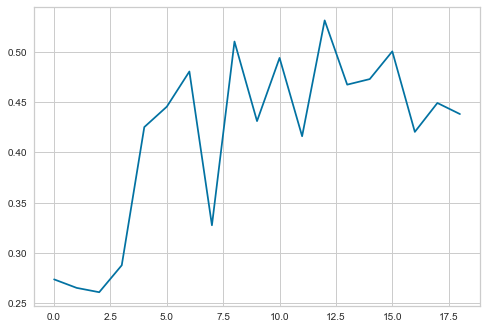

In [130]:
resumen['coherence'].plot()

<AxesSubplot:>

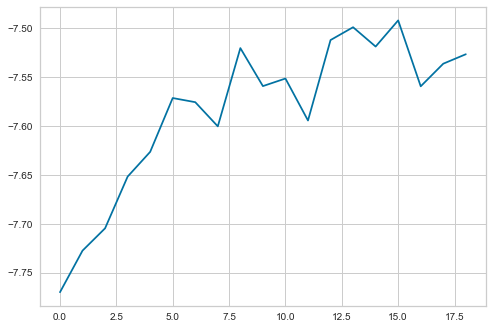

In [131]:
resumen['Perplexity'].plot()

In [132]:
numero = 12

lda = LdaModel(corpus=corpus, id2word=diccionario, 
               num_topics=numero, random_state=42, 
               chunksize=1000, passes=10, alpha='auto')

In [133]:
topicos = lda.print_topics(num_words=5, num_topics=20)
for topico in topicos:
    print(topico)

(0, '0.010*"red" + 0.010*"grupo" + 0.008*"cada" + 0.008*"resultado" + 0.008*"elemento"')
(1, '0.012*"modelo" + 0.011*"tripadvisor" + 0.010*"ranking" + 0.007*"hotel" + 0.007*"posición"')
(2, '0.024*"destino" + 0.022*"turístico" + 0.011*"dato" + 0.009*"servicio" + 0.009*"estudio"')
(3, '0.025*"país" + 0.012*"costo" + 0.012*"dato" + 0.011*"cluster" + 0.010*"algoritmo"')
(4, '0.001*"red" + 0.001*"resultado" + 0.000*"poder" + 0.000*"grupo" + 0.000*"cluster"')
(5, '0.012*"opinión" + 0.011*"palabra" + 0.011*"texto" + 0.010*"valoración" + 0.010*"análisis"')
(6, '0.020*"rata" + 0.017*"brazo" + 0.010*"laberinto" + 0.008*"modelo" + 0.008*"lce"')
(7, '0.000*"resultado" + 0.000*"algoritmo" + 0.000*"poder" + 0.000*"cluster" + 0.000*"red"')
(8, '0.015*"cluster" + 0.012*"empresa" + 0.009*"firma" + 0.009*"negocio" + 0.008*"electrónico"')
(9, '0.019*"documento" + 0.016*"aspecto" + 0.013*"resultado" + 0.011*"cluster" + 0.009*"término"')
(10, '0.022*"entrada" + 0.018*"red" + 0.016*"algoritmo" + 0.013*"pre

In [134]:
import pyLDAvis
import pyLDAvis.gensim 

pyLDAvis.enable_notebook()
plot = pyLDAvis.gensim.prepare(lda, corpus, diccionario)
plot

pyLDAvis.save_html(plot, 'vis.html')

In [135]:
pyLDAvis.show(plot)


Note: if you're in the IPython notebook, pyLDAvis.show() is not the best command
      to use. Consider using pyLDAvis.display(), or pyLDAvis.enable_notebook().
      See more information at http://pyLDAvis.github.io/quickstart.html .

You must interrupt the kernel to end this command

Serving to http://127.0.0.1:8889/    [Ctrl-C to exit]

stopping Server...


127.0.0.1 - - [15/Dec/2021 21:28:26] "GET / HTTP/1.1" 200 -


In [136]:
lda_topic_assignment = [max(p,key=lambda item: item[1]) for p in lda[corpus]]

In [137]:
topico=[]
score =[]

for i,x in lda_topic_assignment:
    topico.append(i)
    score.append(x)

topicos_asig = []
for i in topico:
    for x,y in topicos:
        if i == x:
            topicos_asig.append(y)
                

In [138]:
topico

[0, 3, 0, 11, 8, 1, 6, 0, 8, 10, 9, 8, 5, 1, 0, 5, 9, 9, 0, 2, 3, 0, 1]

In [139]:
df['Topico2'] = topico
df['Tema'] = topicos_asig

In [142]:
pd.options.display.max_colwidth = 120
df[['Cluster','Titulos','Topico2','Tema']].sort_values(by=['Cluster'])

,Cluster,Titulos,Topico2,Tema
11,0,Paper España Articulo de Los Impactos Del Ewom En Hoteles 2013,8,"0.015*""cluster"" + 0.012*""empresa"" + 0.009*""firma"" + 0.009*""negocio"" + 0.008*""electrónico"""
19,0,Paper Mexico EvaluacionDeDestinosTuristicos Ciencia de Datos 2017,2,"0.024*""destino"" + 0.022*""turístico"" + 0.011*""dato"" + 0.009*""servicio"" + 0.009*""estudio"""
4,0,Paper Colombia Clusters como un modelo en el desarrollo de Negocios 2009,8,"0.015*""cluster"" + 0.012*""empresa"" + 0.009*""firma"" + 0.009*""negocio"" + 0.008*""electrónico"""
13,0,Paper España Fiabilidad Comentarios TripAdvisor y Booking.com 2016,1,"0.012*""modelo"" + 0.011*""tripadvisor"" + 0.010*""ranking"" + 0.007*""hotel"" + 0.007*""posición"""
20,1,Paper Mexico Pronósticos para el Rendimiento Del Trigo usando RNA 2010,3,"0.025*""país"" + 0.012*""costo"" + 0.012*""dato"" + 0.011*""cluster"" + 0.010*""algoritmo"""
18,1,Paper Mexico Clasificación de Defectos en Madera Redes Neurales Artificiales 2005,0,"0.010*""red"" + 0.010*""grupo"" + 0.008*""cada"" + 0.008*""resultado"" + 0.008*""elemento"""
21,1,Paper Mexico redes neuronales artificiales procesamiento de imagenes 2011,0,"0.010*""red"" + 0.010*""grupo"" + 0.008*""cada"" + 0.008*""resultado"" + 0.008*""elemento"""
9,1,Paper Ecuador Predicción de Caudales Basados (RNA) para Períodos de Tiempo Sub Diarios 2015,10,"0.022*""entrada"" + 0.018*""red"" + 0.016*""algoritmo"" + 0.013*""precipitación"" + 0.012*""neuronal"""
22,1,Paper Peru Redes neuronales para predecir activos financieros mas liquidos 2019,1,"0.012*""modelo"" + 0.011*""tripadvisor"" + 0.010*""ranking"" + 0.007*""hotel"" + 0.007*""posición"""
6,1,Paper ColomhiavModelado de ratas en laberintos con RNA 2009,6,"0.020*""rata"" + 0.017*""brazo"" + 0.010*""laberinto"" + 0.008*""modelo"" + 0.008*""lce"""


## Analisis de sentimiento

In [143]:
sentimientos={}
         
for line in open("13_CLS_Final.txt"):
    palabra, valor=line.split("\t")
    sentimientos[palabra]=int(valor)

sentimientos

{'confundir': -1,
 'exigen': 0,
 'actua': 0,
 'trier': 0,
 'sacando': -1,
 'conecta': 0,
 'accidentes': -1,
 'roza': 0,
 'altos': -1,
 'cortos': 1,
 'fumaban': 1,
 'agujas': 0,
 'saldar': -1,
 'almacenes': 0,
 'pasote': 1,
 'obligar': -1,
 'aprobaran': 0,
 'garantizaremos': 1,
 'torpes': 1,
 'incondicionales': 1,
 'bernardo': 0,
 'alegria': 1,
 'tenso': -1,
 'racismo': 1,
 'conste': 0,
 'pidieran': 1,
 'chaco': 1,
 'perdona': 0,
 'aguo': 1,
 'pus': 0,
 'concurrido': 0,
 'humana': 0,
 'helen': -1,
 'sinceridad': 1,
 'varas': 0,
 'emitidos': 1,
 'irregularidad': -1,
 'titulaciones': 1,
 'apuntes': 0,
 'comparen': -1,
 'coroneles': 1,
 'estricta': -1,
 'tomo': 1,
 'voy': 0,
 'pasen': 0,
 'docil': 0,
 'saneadas': 0,
 'tarda': -1,
 'desprestigio': -1,
 'bolsillo': -1,
 'aconseja': 0,
 'tito': 1,
 'grande': 1,
 'carreteras': -1,
 'desato': -1,
 'choque': -1,
 'herederos': -1,
 'interrumpir': -1,
 'falsificado': 1,
 'pareja': 0,
 'catedral': 0,
 'brindis': 1,
 'malgasten': -1,
 'trabajando': 

In [144]:
def score_sentimental(texto):
    puntaje = []
    for word in texto:
        puntaje.append(sentimientos.get(word,0))
    return sum(puntaje)

In [145]:
df['Score_sentimental']= df.apply(lambda x: score_sentimental(x['tokenizado']), axis=1)

In [146]:
pd.options.display.max_colwidth = 120
df[['Cluster','Titulos','Score_sentimental']].sort_values(by=['Cluster'])

,Cluster,Titulos,Score_sentimental
11,0,Paper España Articulo de Los Impactos Del Ewom En Hoteles 2013,127
19,0,Paper Mexico EvaluacionDeDestinosTuristicos Ciencia de Datos 2017,276
4,0,Paper Colombia Clusters como un modelo en el desarrollo de Negocios 2009,463
13,0,Paper España Fiabilidad Comentarios TripAdvisor y Booking.com 2016,100
20,1,Paper Mexico Pronósticos para el Rendimiento Del Trigo usando RNA 2010,132
18,1,Paper Mexico Clasificación de Defectos en Madera Redes Neurales Artificiales 2005,89
21,1,Paper Mexico redes neuronales artificiales procesamiento de imagenes 2011,372
9,1,Paper Ecuador Predicción de Caudales Basados (RNA) para Períodos de Tiempo Sub Diarios 2015,146
22,1,Paper Peru Redes neuronales para predecir activos financieros mas liquidos 2019,222
6,1,Paper ColomhiavModelado de ratas en laberintos con RNA 2009,18


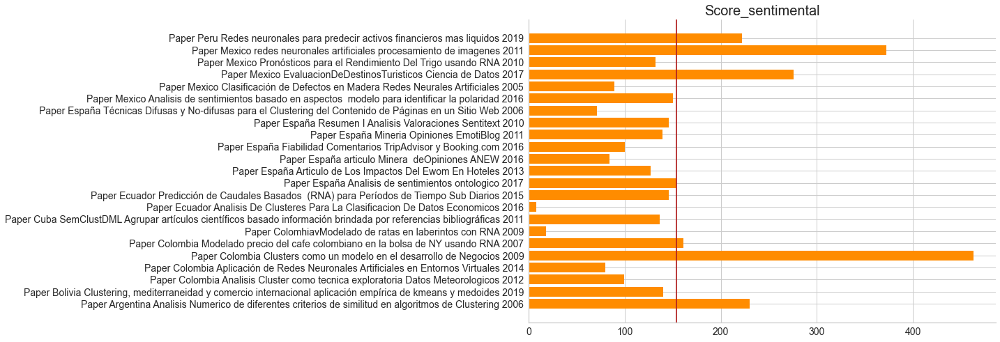

In [148]:
plt.figure(figsize=(12,8))
ax = plt.subplot(111)
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.barh(df1['Titulos'],df['Score_sentimental'],color = 'darkorange')
plt.title('Score_sentimental',fontsize=20 )
plt.axvline(x=df['Score_sentimental'].mean(), color = 'firebrick')

plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.show()

In [149]:
df.groupby('Cluster').agg({'Score_sentimental': 'mean'})

,Score_sentimental
Cluster,
0,241.5
1,152.5
2,114.0
3,134.6
